In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp, epps_singleton_2samp
import matplotlib.patches as mpatches

# Rocklin - Longxing Scnf Feature Comparison

In [41]:
#show total number of entries, topologies used
data = pd.read_csv('./data/df_aggregated_spc.csv')

library_inx = data["dataset"].isin(["Rocklin","Longxing"])

#only use Longxing and Rocklin data
data = data.loc[library_inx,:]


print("Total number of entries --> %s"%len(data))
print("Total number of topologies --> %s"%len(data.topology.unique()))
print("")

# define rosetta features
ros_features = pd.read_csv('./data/rosetta_features.csv')['0'].to_list()

# define entropy features
spc_features = pd.read_csv('./data/entropy_features.csv')["0"].to_list()

# define stability ('stable'/'unstable')
data['stabilityscore_cnn_calibrated_2classes'] = data['stabilityscore_cnn_calibrated'] > 1
stable_proteins = data[data['stabilityscore_cnn_calibrated_2classes']==1]
unstable_proteins = data[data['stabilityscore_cnn_calibrated_2classes']==0]

Total number of entries --> 35728
Total number of topologies --> 4



In [42]:
data[data["dataset"]=="Longxing"]['nres'].mean()

64.39123102866779

In [43]:
from HelperFunctions.feature_visualizations import show_all_plots

# General distributions

In [44]:
rocklin_df = data[data["dataset"]=="Rocklin"]
longxing_df = data[data["dataset"]=="Longxing"]

Number of Unstable: 13442
number of Stable: 2717


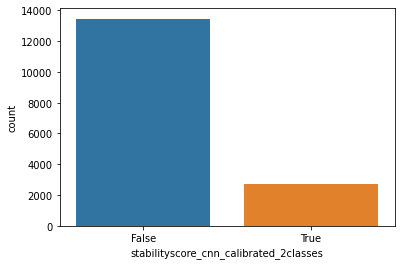

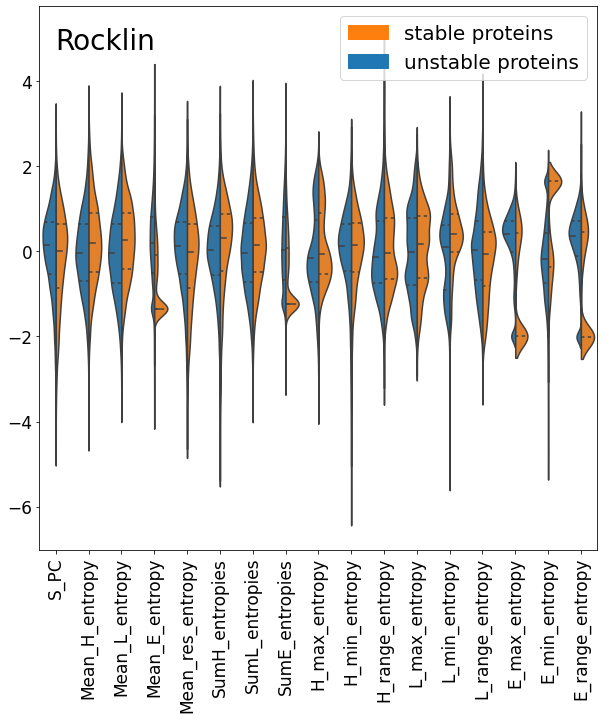

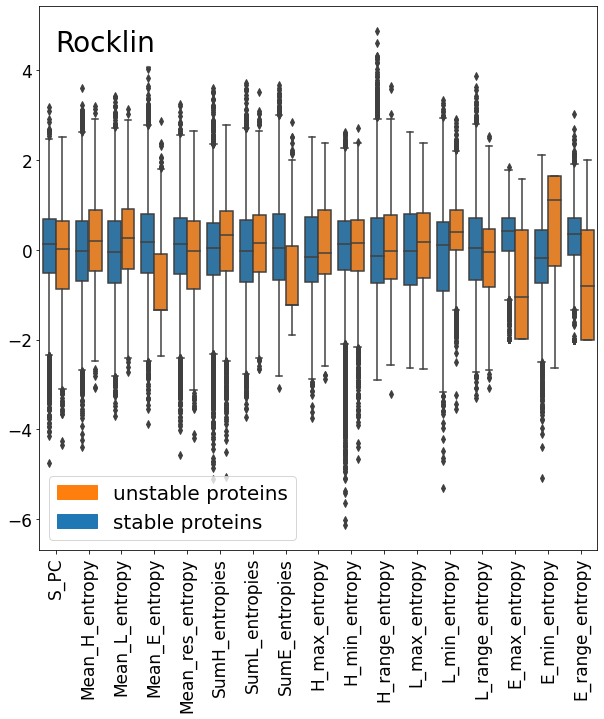

In [45]:
show_all_plots(
        data=rocklin_df,
        features=spc_features,
        target="stabilityscore_cnn_calibrated_2classes",
        title_name="Rocklin")

Number of Unstable: 17001
number of Stable: 2568


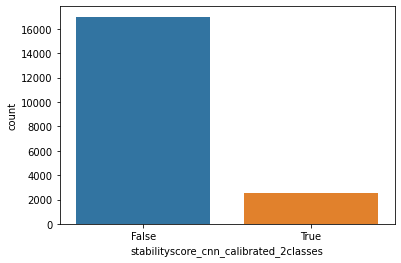

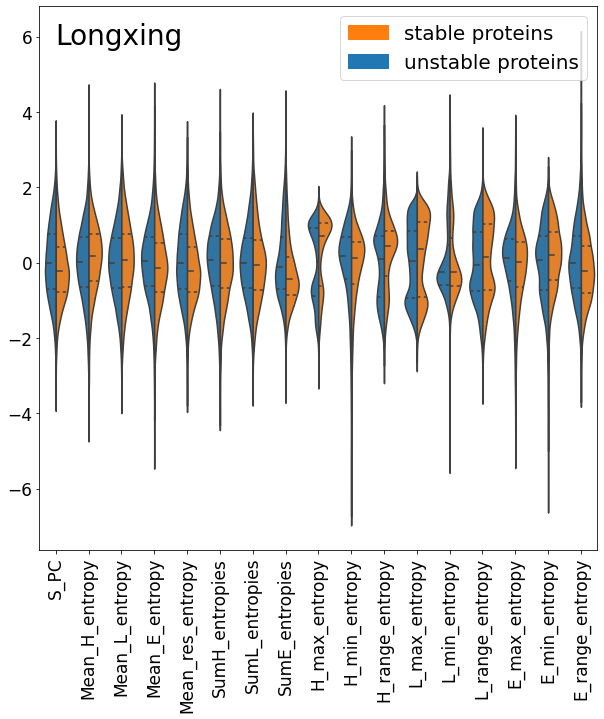

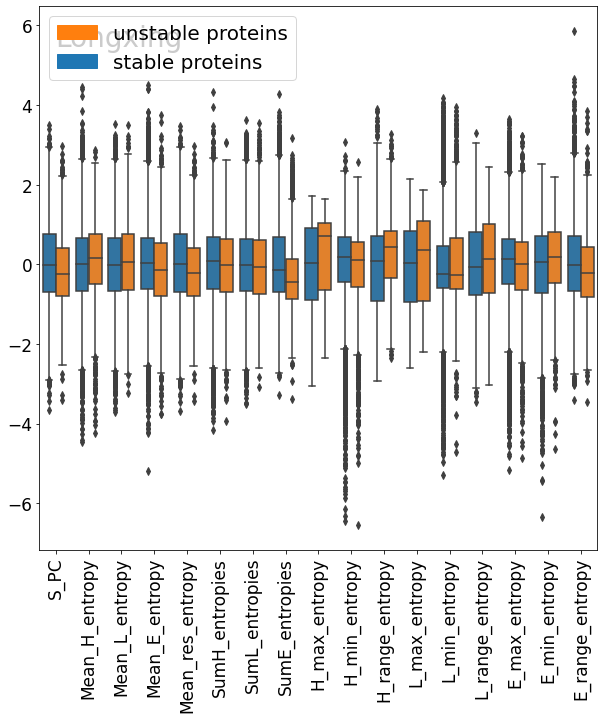

In [46]:
show_all_plots(
        data=longxing_df,
        features=spc_features,
        target="stabilityscore_cnn_calibrated_2classes",
        title_name="Longxing")

# Topology specific distributions

## Rocklin dataset

--------- Distributions for EEHEE topology ----------
Number of Unstable: 4669
number of Stable: 578


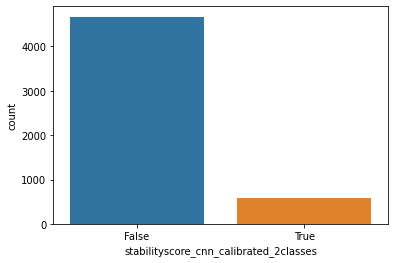

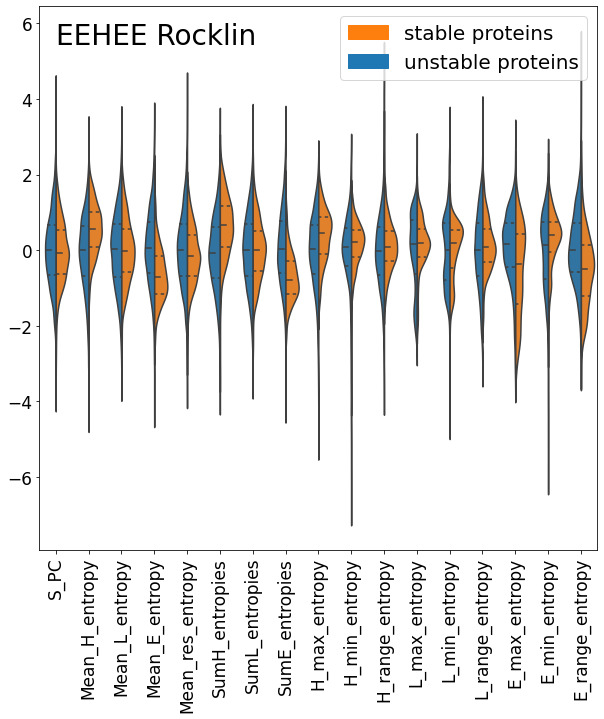

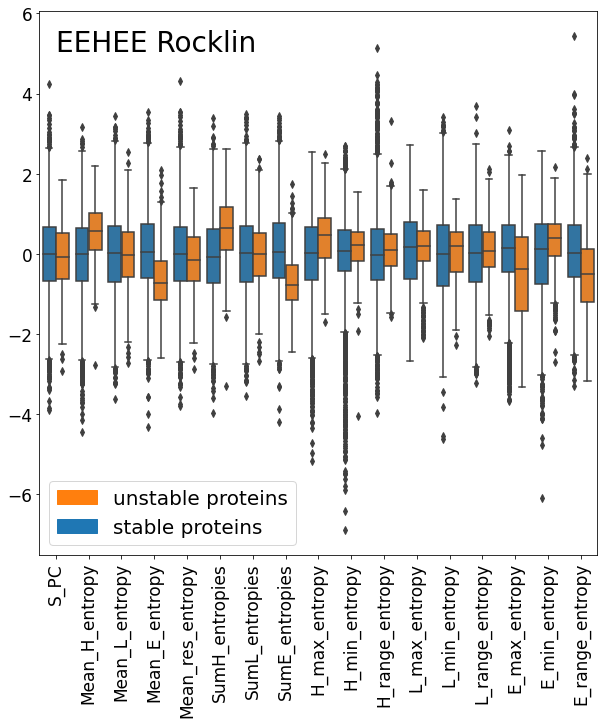

--------- Distributions for EHEE topology ----------
Number of Unstable: 2781
number of Stable: 676


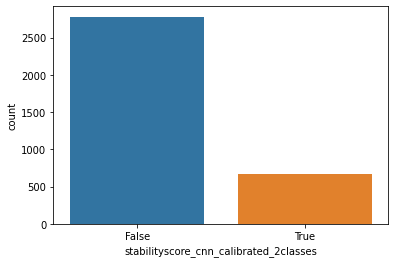

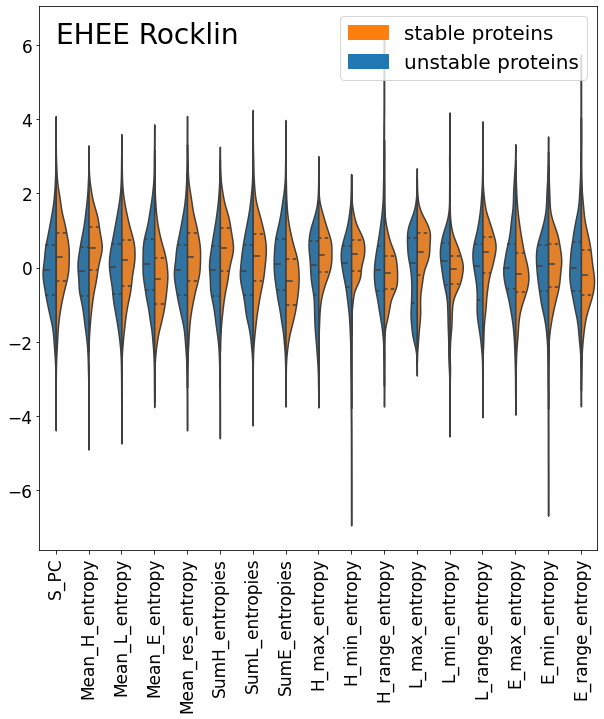

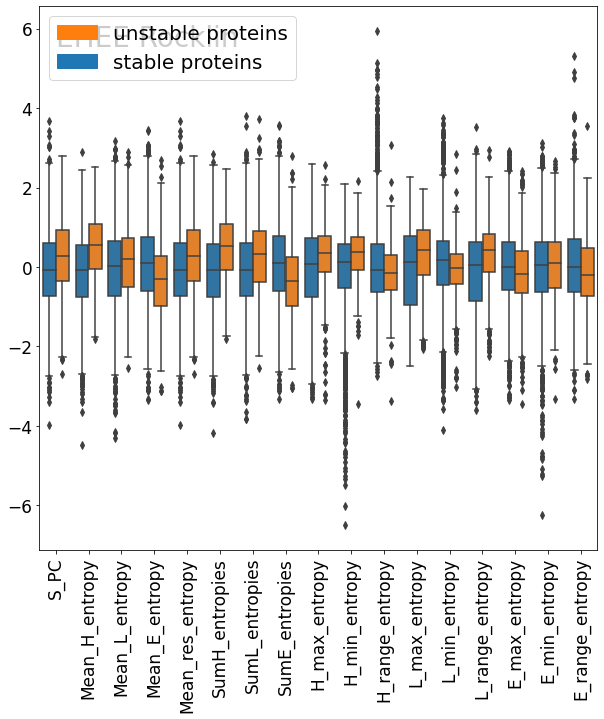

--------- Distributions for HEEH topology ----------
Number of Unstable: 4869
number of Stable: 117


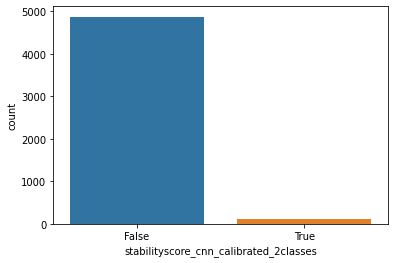

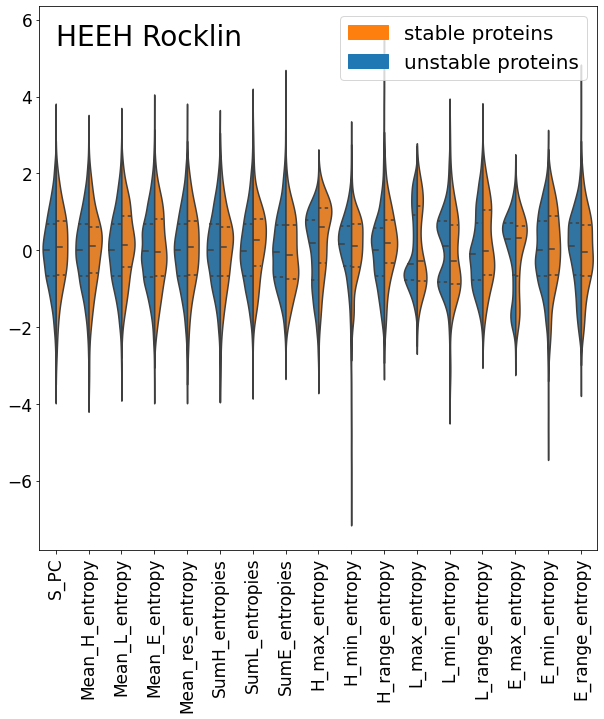

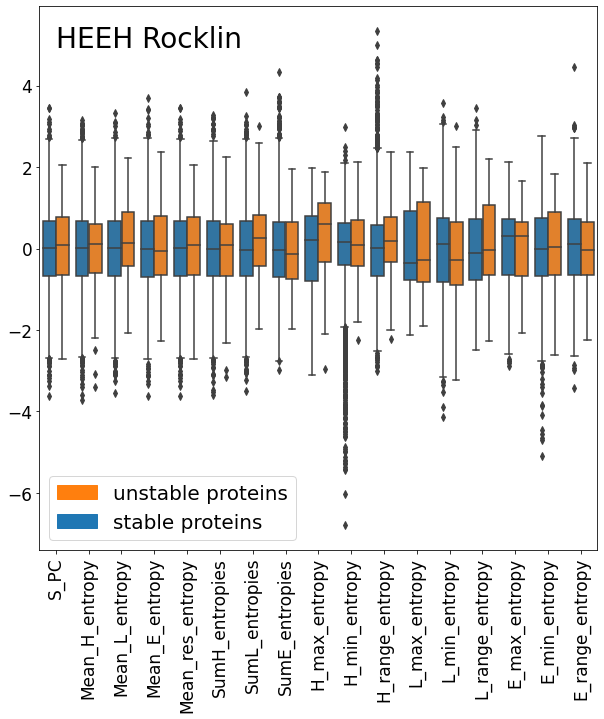

--------- Distributions for HHH topology ----------
Number of Unstable: 1346
number of Stable: 1123


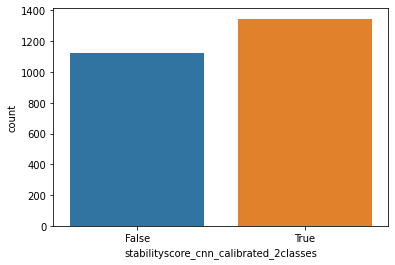

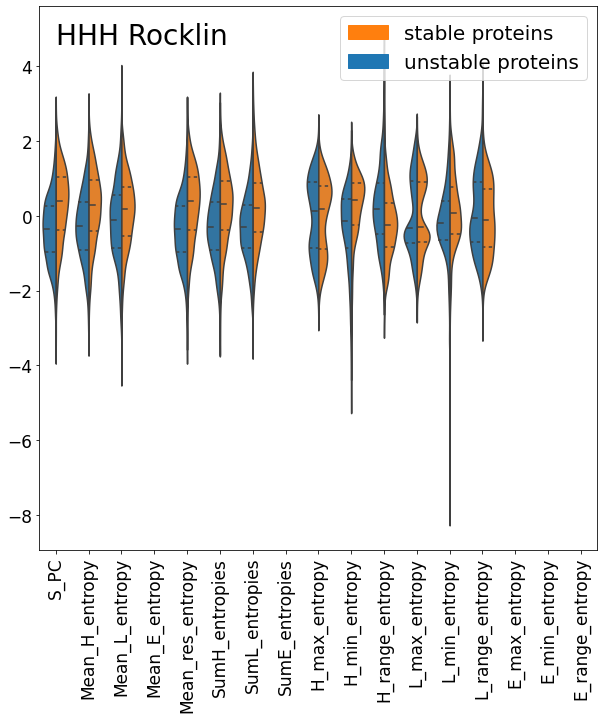

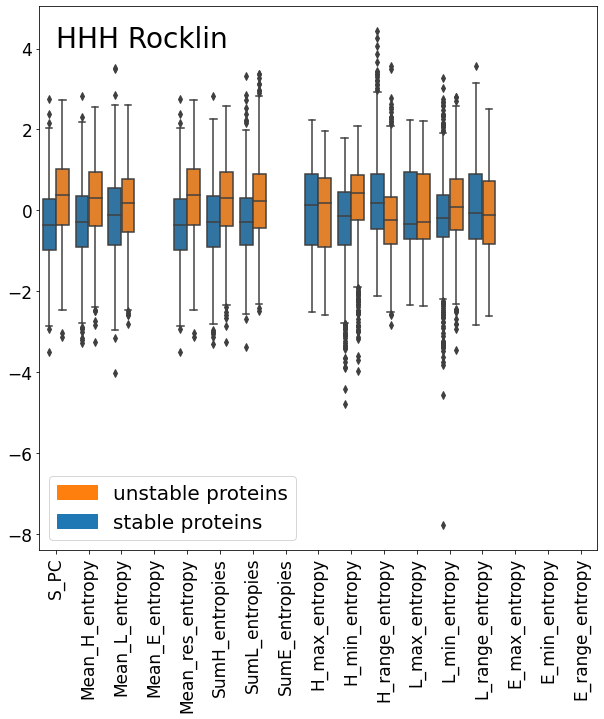

In [47]:
#show plots for all features per topology

data_sub = data[data["dataset"]=="Rocklin"]

#get a list of topologies
topologies_list = list(data_sub['topology'].unique())

for topology in topologies_list:
    print("--------- Distributions for %s topology ----------"%topology)
    
    #subset the data_sub to specify for a topology
    df = data_sub[data_sub['topology']==topology]
    
    #plot distributions for subset
    show_all_plots(data=df, 
               features=spc_features, 
               target='stabilityscore_cnn_calibrated_2classes',
               title_name='%s Rocklin'%topology)

In [48]:
unstable_count = []
stable_count = []
for top in data_sub['topology'].unique():
    #subset dataset by topology
    df_top = data_sub[data_sub["topology"]==top]
    
    unstable,stable = df_top["stabilityscore_cnn_calibrated_2classes"].value_counts()
    
    unstable_count.append(unstable)
    stable_count.append(stable)

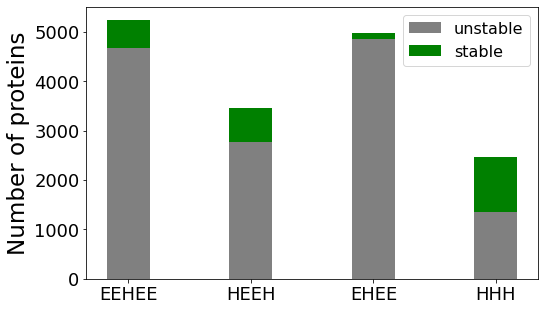

In [49]:
a = 5

# list of topologies
labels = data_sub["topology"].value_counts().index 

width = 0.35       # the width of the bars: can also be len(x) sequence

fig, ax = plt.subplots(figsize=(a*1.618,a))

ax.bar(labels, unstable_count, width,  label='unstable',color='gray')
ax.bar(labels, stable_count, width, bottom=unstable_count,
       label='stable',color='green')

ax.set_ylabel('Number of proteins',fontsize='23')
plt.xticks(fontsize='18')
plt.yticks(fontsize='18')

ax.legend(fontsize="16")

plt.show()

## Longxing

--------- Distributions for HEEH topology ----------
Number of Unstable: 10007
number of Stable: 1906


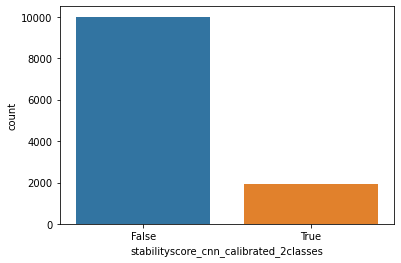

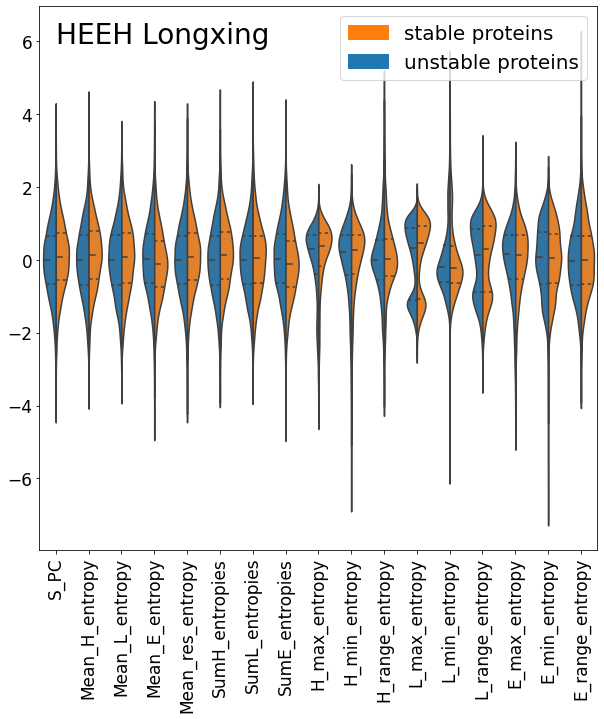

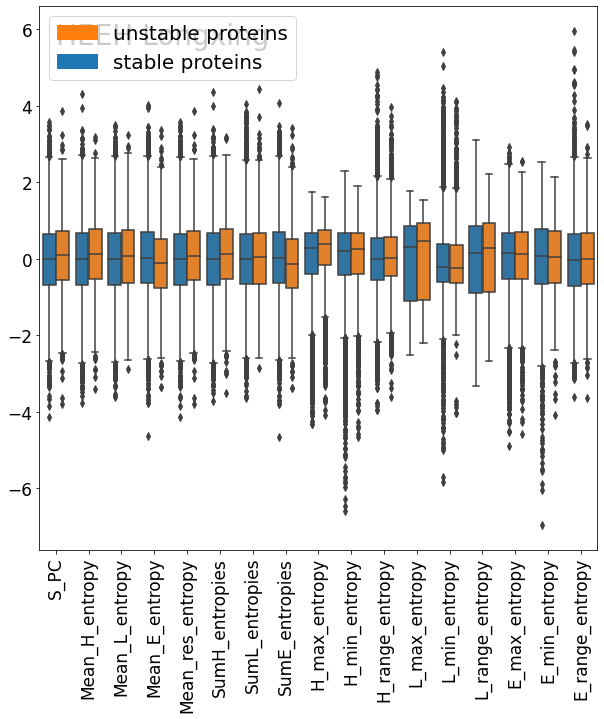

--------- Distributions for EHEE topology ----------
Number of Unstable: 2654
number of Stable: 534


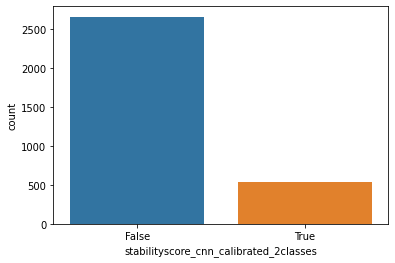

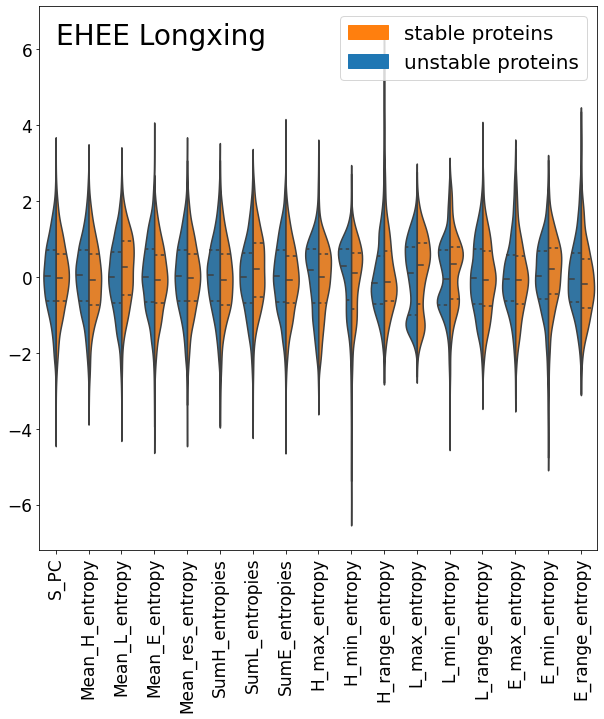

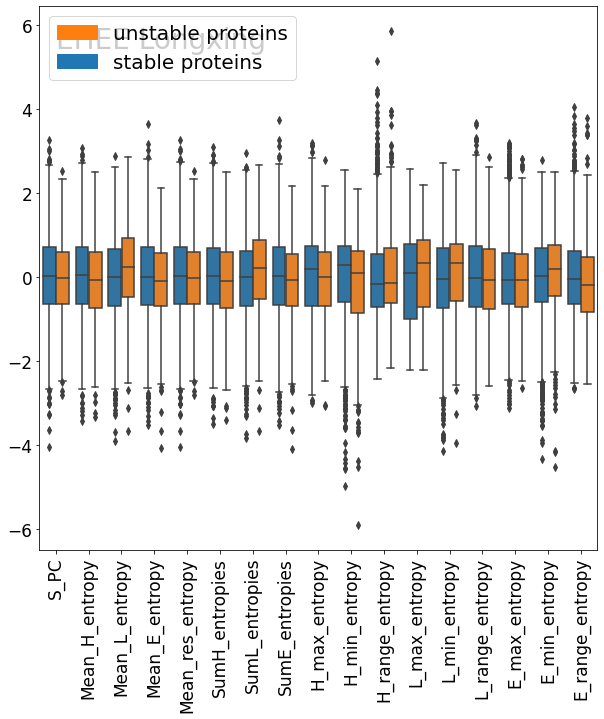

--------- Distributions for EEHEE topology ----------
Number of Unstable: 4340
number of Stable: 128


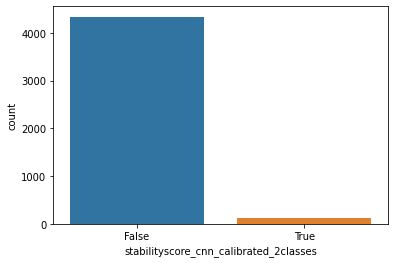

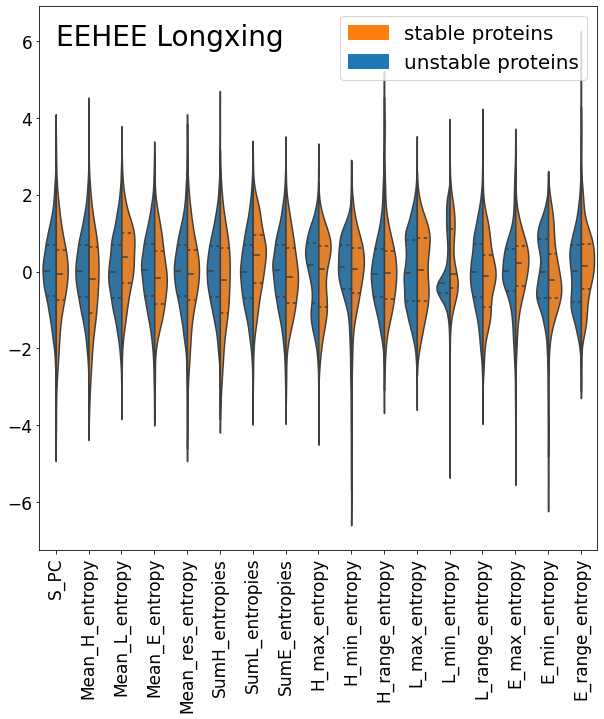

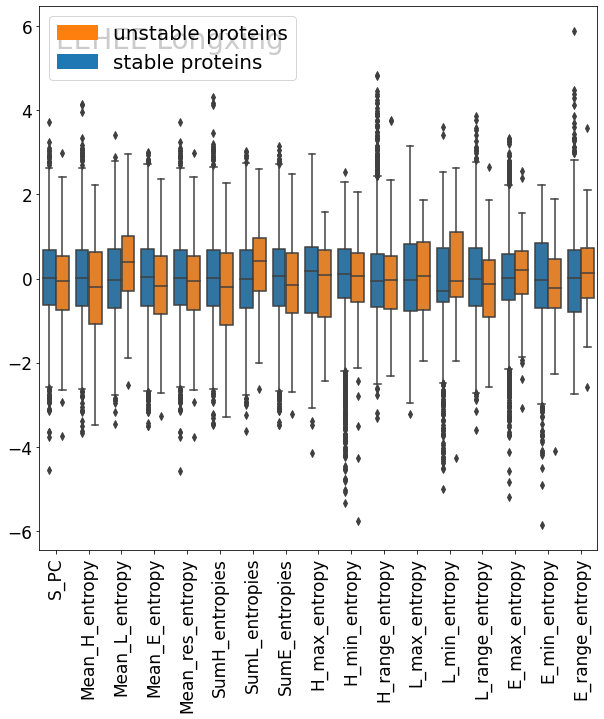

In [50]:
#show plots for all features per topology

data_sub = data[data["dataset"]=="Longxing"]

#get a list of topologies
topologies_list = list(data_sub['topology'].unique())

for topology in topologies_list:
    print("--------- Distributions for %s topology ----------"%topology)
    
    #subset the data_sub to specify for a topology
    df = data_sub[data_sub['topology']==topology]
    
    #plot distributions for subset
    show_all_plots(data=df, 
               features=spc_features, 
               target='stabilityscore_cnn_calibrated_2classes',
               title_name='%s Longxing'%topology)

In [51]:
unstable_count = []
stable_count = []
for top in data_sub['topology'].unique():
    #subset dataset by topology
    df_top = data_sub[data_sub["topology"]==top]
    
    unstable,stable = df_top["stabilityscore_cnn_calibrated_2classes"].value_counts()
    
    unstable_count.append(unstable)
    stable_count.append(stable)

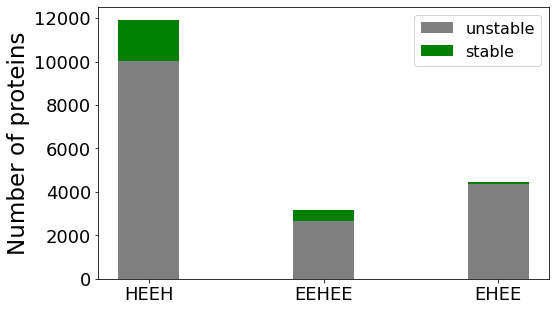

In [52]:
a = 5

# list of topologies
labels = data_sub["topology"].value_counts().index 

width = 0.35       # the width of the bars: can also be len(x) sequence

fig, ax = plt.subplots(figsize=(a*1.618,a))

ax.bar(labels, unstable_count, width,  label='unstable',color='gray')
ax.bar(labels, stable_count, width, bottom=unstable_count,
       label='stable',color='green')

ax.set_ylabel('Number of proteins',fontsize='23')
plt.xticks(fontsize='18')
plt.yticks(fontsize='18')

ax.legend(fontsize="16")

plt.show()

## Rocklin+Longxing

In [53]:
target = 'stabilityscore_cnn_calibrated_2classes'
features = spc_features
sub_fets_rocklin = ["R-EEHEE L_min_entropy","R-HEEH SumL_entropies","R-HHH S_PC",
                   "R-EEHEE L_max_entropy","R-HEEH L_max_entropy","R-EEHEE SumE_entropies",
                   "R-HHH H_max_entropy"]

sub_fets_longxing = ["L-EHEE L_min_entropy","L-EEHEE SumL_entropies","L-EEHEE SumL_entropies",
                    "L-EHEE SumE_entropies", "L-EEHEE SumL_entropies","L-HEEH SumL_entropies",
                    "L-EEHEE H_max_entropy"]


#show total number of entries, topologies used
df = pd.read_csv('./data/df_aggregated_spc.csv')
# define stability ('stable'/'unstable')
df['stabilityscore_cnn_calibrated_2classes'] = df['stabilityscore_cnn_calibrated'] > 1

# I standardize entropy features here to make the visualizations more intuitive later
df[spc_features] = (df[spc_features] - df[spc_features].mean()) / (df[spc_features].std()) 


rocklin_library_inx = df["dataset"].isin(["Rocklin"])
longxing_library_inx = df["dataset"].isin(["Longxing"])

#only use Longxing and Rocklin data
df_rocklin = df.loc[rocklin_library_inx,:]
df_rocklin['topology'] = ["R-"+i for i in df_rocklin['topology']]

df_longxing = df.loc[longxing_library_inx,:]
df_longxing['topology'] = ["L-"+i for i in df_longxing['topology']]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [54]:
# change the feature names to include a description of dataset and 
# topology
rocklin_topology_df = []
for topology in df_rocklin['topology'].unique():
    
    # focus on the subset of the dataframe that only has a given topology
    sub_df = df_rocklin[df_rocklin['topology']==topology]
    
    new_column_names = {col_name:topology+" "+col_name for col_name in features}
    
    sub_df = sub_df.rename(new_column_names,axis=1)
    
    rocklin_topology_df.append(sub_df)
    
# merge all of these columns into one df    
df_rocklin  = pd.concat(rocklin_topology_df)

In [55]:
 # change the feature names to include a description of dataset and 
# topology
longxing_topology_df = []
for topology in df_longxing['topology'].unique():
    # focus on the subset of the dataframe that only has a given topology
    sub_df = df_longxing[df_longxing['topology']==topology]
    
    new_column_names = {col_name:topology+" "+col_name for col_name in features}
    
    sub_df = sub_df.rename(new_column_names,axis=1)
    
    longxing_topology_df.append(sub_df)
    
    
# merge all of these columns into one df    
df_longxing  = pd.concat(longxing_topology_df)

In [56]:
y_rocklin = df_rocklin[target] #target
x_rocklin = df_rocklin[sub_fets_rocklin] #features


y_longxing = df_longxing[target] #target
x_longxing = df_longxing[sub_fets_longxing] #features

In [57]:
#show violin plot
data_rocklin = x_rocklin
#data_n_2_rocklin = (data_rocklin - data_rocklin.mean()) / (data_rocklin.std())              # standardization
data_n_2_rocklin = data_rocklin
data_rocklin = pd.concat([y_rocklin,data_n_2_rocklin.loc[:,sub_fets_rocklin]],axis=1)
data_rocklin = pd.melt(data_rocklin,id_vars='stabilityscore_cnn_calibrated_2classes',
                        var_name='Features',
                        value_name=None)

In [58]:
#show violin plot
data_longxing = x_longxing
#data_n_2_longxing = (data_longxing - data_longxing.mean()) / (data_longxing.std())              # standardization
data_n_2_longxing = data_longxing
data_longxing = pd.concat([y_longxing,data_n_2_longxing.loc[:,sub_fets_longxing]],axis=1)
data_longxing = pd.melt(data_longxing,id_vars='stabilityscore_cnn_calibrated_2classes',
                        var_name='Features',
                        value_name=None)

In [59]:
# Rocklin and Longxing melted data put together
df_total = pd.concat([data_rocklin,data_longxing],axis=0)



### plot for heatmap containing Rosetta and Entropy features

In [60]:
# the order in which i want to plot the data
order_cols = ["L-EHEE L_min_entropy","R-EEHEE L_min_entropy",
             "R-HEEH SumL_entropies","L-EEHEE SumL_entropies",
             "L-HEEH SumL_entropies",
             "R-EEHEE L_max_entropy","R-HEEH L_max_entropy",
             "R-EEHEE SumE_entropies","L-EHEE SumE_entropies",
             "R-HHH S_PC"]

sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Features"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

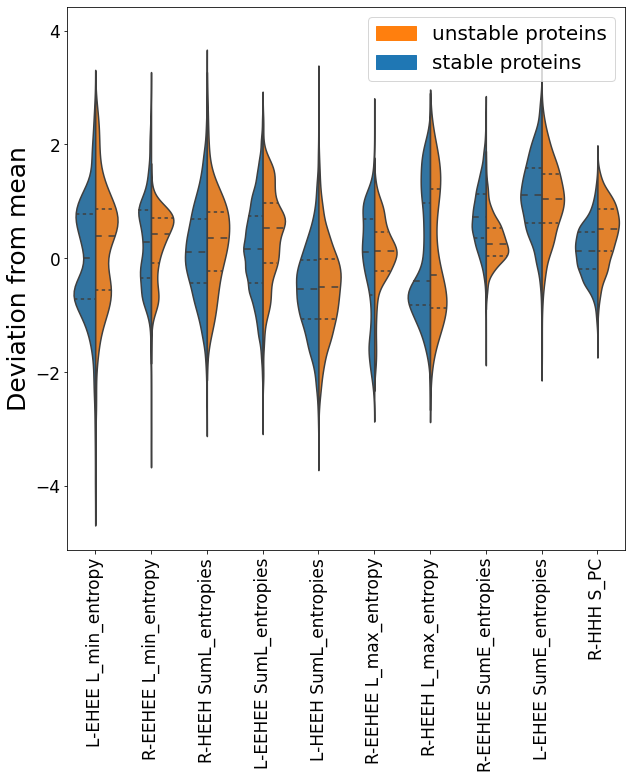

In [61]:
plt.figure(figsize=(10,10))
sns.violinplot(x="Features", y=None, hue='stabilityscore_cnn_calibrated_2classes',data=sorted_df_total,split=True, 
               inner="quart",orient='v')
plt.xticks(rotation=0)

orange_patch = mpatches.Patch(color='tab:orange', label='unstable proteins')
blue_patch = mpatches.Patch(color='tab:blue', label='stable proteins')
plt.legend(handles=[orange_patch,blue_patch],fontsize="20",loc="best")


# plt.text(0,(plt.gca().get_ylim()[-1] - 1),
#          s=title_name,bbox={"ec":"white",'fc':"white","boxstyle":"round"},
#          fontsize="28")

plt.xticks(fontsize="17",rotation=90)

plt.yticks(fontsize="17")
plt.ylabel("Deviation from mean",fontsize='25')
plt.xlabel("")



plt.show()
plt.close('all')

### plot for heatmap containing only Entropy features

In [62]:
target = 'stabilityscore_cnn_calibrated_2classes'
features = spc_features
sub_fets_rocklin = ["R-EEHEE Mean_E_entropy","R-HHH Mean_L_entropy","R-EEHEE SumE_entropies",
                    "R-EEHEE L_max_entropy","R-HHH L_max_entropy","R-HEEH H_range_entropy",
                    "R-EEHEE L_max_entropy"]

sub_fets_longxing = ["L-EEHEE Mean_E_entropy","L-EEHEE Mean_L_entropy","L-EEHEE SumL_entropies",
                     "L-EEHEE H_range_entropy","L-HEEH Mean_H_entropy","L-EHEE Mean_H_entropy",
                     "L-HEEH L_max_entropy"]


#show total number of entries, topologies used
df = pd.read_csv('./data/df_aggregated_spc.csv')
# define stability ('stable'/'unstable')
df['stabilityscore_cnn_calibrated_2classes'] = df['stabilityscore_cnn_calibrated'] > 1

# I standardize entropy features here to make the visualizations more intuitive later
df[spc_features] = (df[spc_features] - df[spc_features].mean()) / (df[spc_features].std()) 


rocklin_library_inx = df["dataset"].isin(["Rocklin"])
longxing_library_inx = df["dataset"].isin(["Longxing"])

#only use Longxing and Rocklin data
df_rocklin = df.loc[rocklin_library_inx,:]
df_rocklin['topology'] = ["R-"+i for i in df_rocklin['topology']]

df_longxing = df.loc[longxing_library_inx,:]
df_longxing['topology'] = ["L-"+i for i in df_longxing['topology']]

# change the feature names to include a description of dataset and 
# topology
rocklin_topology_df = []
for topology in df_rocklin['topology'].unique():
    
    # focus on the subset of the dataframe that only has a given topology
    sub_df = df_rocklin[df_rocklin['topology']==topology]
    
    new_column_names = {col_name:topology+" "+col_name for col_name in features}
    
    sub_df = sub_df.rename(new_column_names,axis=1)
    
    rocklin_topology_df.append(sub_df)
    
# merge all of these columns into one df    
df_rocklin  = pd.concat(rocklin_topology_df)

 # change the feature names to include a description of dataset and 
# topology
longxing_topology_df = []
for topology in df_longxing['topology'].unique():
    # focus on the subset of the dataframe that only has a given topology
    sub_df = df_longxing[df_longxing['topology']==topology]
    
    new_column_names = {col_name:topology+" "+col_name for col_name in features}
    
    sub_df = sub_df.rename(new_column_names,axis=1)
    
    longxing_topology_df.append(sub_df)
    
    
# merge all of these columns into one df    
df_longxing  = pd.concat(longxing_topology_df)

y_rocklin = df_rocklin[target] #target
x_rocklin = df_rocklin[sub_fets_rocklin] #features


y_longxing = df_longxing[target] #target
x_longxing = df_longxing[sub_fets_longxing] #features

#show violin plot
data_rocklin = x_rocklin
#data_n_2_rocklin = (data_rocklin - data_rocklin.mean()) / (data_rocklin.std())              # standardization
data_n_2_rocklin = data_rocklin
data_rocklin = pd.concat([y_rocklin,data_n_2_rocklin.loc[:,sub_fets_rocklin]],axis=1)
data_rocklin = pd.melt(data_rocklin,id_vars='stabilityscore_cnn_calibrated_2classes',
                        var_name='Features',
                        value_name=None)

#show violin plot
data_longxing = x_longxing
#data_n_2_longxing = (data_longxing - data_longxing.mean()) / (data_longxing.std())              # standardization
data_n_2_longxing = data_longxing
data_longxing = pd.concat([y_longxing,data_n_2_longxing.loc[:,sub_fets_longxing]],axis=1)
data_longxing = pd.melt(data_longxing,id_vars='stabilityscore_cnn_calibrated_2classes',
                        var_name='Features',
                        value_name=None)

# Rocklin and Longxing melted data put together
df_total = pd.concat([data_rocklin,data_longxing],axis=0)



/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


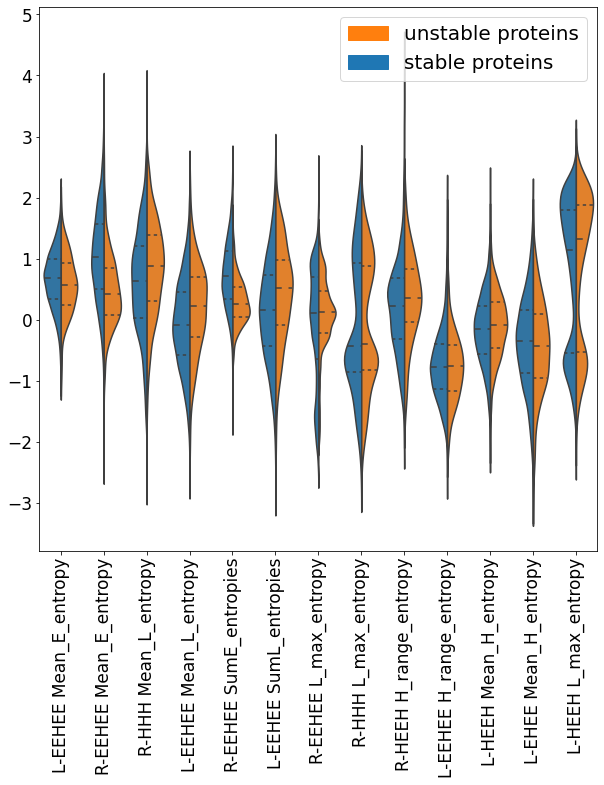

In [63]:
# the order in which i want to plot the data
order_cols = ["L-EEHEE Mean_E_entropy","R-EEHEE Mean_E_entropy",
             "R-HHH Mean_L_entropy","L-EEHEE Mean_L_entropy",
              "R-EEHEE SumE_entropies",
              "L-EEHEE SumL_entropies",            
             "R-EEHEE L_max_entropy","R-HHH L_max_entropy",
              "R-HEEH H_range_entropy","L-EEHEE H_range_entropy",
              "L-HEEH Mean_H_entropy","L-EHEE Mean_H_entropy",
              "L-HEEH L_max_entropy", "R-EEHEE L_max_entropy"
             ]


sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Features"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

plt.figure(figsize=(10,10))
sns.violinplot(x="Features", y=None, hue='stabilityscore_cnn_calibrated_2classes',data=sorted_df_total,split=True, 
               inner="quart",orient='v')
plt.xticks(rotation=0)

orange_patch = mpatches.Patch(color='tab:orange', label='unstable proteins')
blue_patch = mpatches.Patch(color='tab:blue', label='stable proteins')
plt.legend(handles=[orange_patch,blue_patch],fontsize="20",loc="best")


# plt.text(0,(plt.gca().get_ylim()[-1] - 1),
#          s=title_name,bbox={"ec":"white",'fc':"white","boxstyle":"round"},
#          fontsize="28")

plt.xticks(fontsize="17",rotation=90)

plt.yticks(fontsize="17")
plt.xlabel("")
plt.ylabel("")



plt.show()
plt.close('all')

### plot for heatmap containing only Rocklin Entropy features

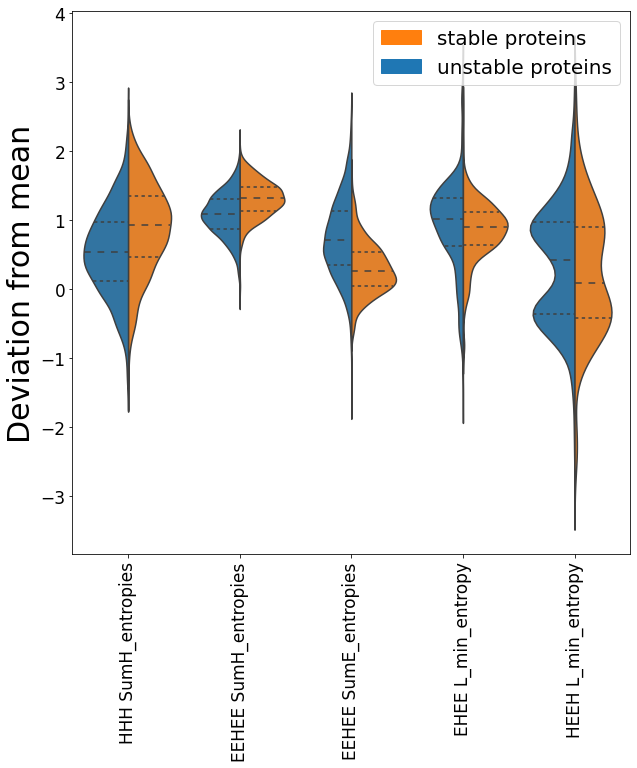

In [64]:
### plot for heatmap containing only Entropy features

target = 'stabilityscore_cnn_calibrated_2classes'
features = spc_features
sub_fets_rocklin =[
            "HHH SumH_entropies","EEHEE SumH_entropies",
            "EEHEE SumE_entropies",        
             "EHEE L_min_entropy","HEEH L_min_entropy",
             ]

#show total number of entries, topologies used
df = pd.read_csv('./data/df_aggregated_spc.csv')
# define stability ('stable'/'unstable')
df['stabilityscore_cnn_calibrated_2classes'] = df['stabilityscore_cnn_calibrated'] > 1

# I standardize entropy features here to make the visualizations more intuitive later
df[spc_features] = (df[spc_features] - df[spc_features].mean()) / (df[spc_features].std()) 


rocklin_library_inx = df["dataset"].isin(["Rocklin"])


#only use Rocklin data
df_rocklin = df.loc[rocklin_library_inx,:]

# change the feature names to include a description of dataset and 
# topology
rocklin_topology_df = []
for topology in df_rocklin['topology'].unique():
    
    # focus on the subset of the dataframe that only has a given topology
    sub_df = df_rocklin[df_rocklin['topology']==topology]
    
    new_column_names = {col_name:topology+" "+col_name for col_name in features}
    
    sub_df = sub_df.rename(new_column_names,axis=1)
    
    rocklin_topology_df.append(sub_df)
    
# merge all of these columns into one df    
df_rocklin  = pd.concat(rocklin_topology_df)


y_rocklin = df_rocklin[target] #target
x_rocklin = df_rocklin[sub_fets_rocklin] #features



#show violin plot
data_rocklin = x_rocklin
#data_n_2_rocklin = (data_rocklin - data_rocklin.mean()) / (data_rocklin.std())              # standardization
data_n_2_rocklin = data_rocklin
data_rocklin = pd.concat([y_rocklin,data_n_2_rocklin.loc[:,sub_fets_rocklin]],axis=1)
data_rocklin = pd.melt(data_rocklin,id_vars='stabilityscore_cnn_calibrated_2classes',
                        var_name='Features',
                        value_name=None)


# Rocklin and Longxing melted data put together
df_total = data_rocklin



# the order in which i want to plot the data
order_cols = [
            "HHH SumH_entropies","EEHEE SumH_entropies",
            "EEHEE SumE_entropies",        
             "EHEE L_min_entropy","HEEH L_min_entropy",
             ]


sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Features"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

plt.figure(figsize=(10,10))
sns.violinplot(x="Features", y=None, hue='stabilityscore_cnn_calibrated_2classes',data=sorted_df_total,split=True, 
               inner="quart",orient='v')
plt.xticks(rotation=0)

orange_patch = mpatches.Patch(color='tab:orange', label='stable proteins')
blue_patch = mpatches.Patch(color='tab:blue', label='unstable proteins')
plt.legend(handles=[orange_patch,blue_patch],fontsize="20",loc="best")


# plt.text(0,(plt.gca().get_ylim()[-1] - 1),
#          s=title_name,bbox={"ec":"white",'fc':"white","boxstyle":"round"},
#          fontsize="28")

plt.xticks(fontsize="17",rotation=90)

plt.yticks(fontsize="17")
plt.xlabel("")
plt.ylabel("Deviation from mean",fontsize='30')



plt.show()
plt.close('all')

# KS value comparison (General trend)

In [65]:
from scipy.stats import ks_2samp

#show total number of entries, topologies used
data = pd.read_csv('./data/df_aggregated_spc.csv')

library_inx = data["dataset"].isin(["Rocklin","Longxing"])

#only use Longxing and Rocklin data
data = data.loc[library_inx,:]

data['stabilityscore_cnn_calibrated_2classes'] = data['stabilityscore_cnn_calibrated'] >= 1


# get dataframes subset for Rocklin or Longxing topology
rocklin_df = data[data["dataset"]=='Rocklin']
longxing_df = data[data['dataset']=='Longxing']

## Rocklin

In [66]:
stable_proteins = rocklin_df[rocklin_df["stabilityscore_cnn_calibrated_2classes"]==1]
unstable_proteins = rocklin_df[rocklin_df["stabilityscore_cnn_calibrated_2classes"]==0]


#get a list of topologies
topologies_list = list(rocklin_df['topology'].unique())


# get KS values for all features
rows = []
for fet in spc_features:
    subset_stable = stable_proteins[fet]
    subset_unstable = unstable_proteins[fet]
    
    ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
    rows.append([fet,ks_value,False,p_value]) #third row corresponds to 'is_rosetta' column

for fet in ros_features:
    subset_stable = stable_proteins[fet]
    subset_unstable = unstable_proteins[fet]
    
    ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
    rows.append([fet,ks_value,True,p_value])

    
    
#make a dataframe from ks value data
ks_values_all = pd.DataFrame(rows,columns=['Feature','KS','is_rosetta','P-value'])

#subset for entropy feature ks values and rosetta feature ks values
ks_values_all_spc = ks_values_all[ks_values_all['is_rosetta']==False]
ks_values_all_ros = ks_values_all[ks_values_all['is_rosetta']==True]


#get index of row with highest ks value for entropy and rosetta feature subset
spc_max_inx = ks_values_all_spc['KS'].idxmax()
ros_max_inx = ks_values_all_ros['KS'].idxmax()

print("Entropy feature with highest KS Value:\n",ks_values_all.iloc[spc_max_inx,:])
print()
print("Rosetta feature with highest KS Value\n",ks_values_all.iloc[ros_max_inx,:])

Entropy feature with highest KS Value:
 Feature       E_max_entropy
KS                 0.411855
is_rosetta            False
P-value                   0
Name: 14, dtype: object

Rosetta feature with highest KS Value
 Feature       score_per_res
KS                 0.648596
is_rosetta             True
P-value                   0
Name: 121, dtype: object


In [67]:
# these are the set of features that don't contain beta sheet features so that the KS value analysis
# isn't strayed
non_biased_features = [f for f in ks_values_all_spc["Feature"].values if "E_" not in f]

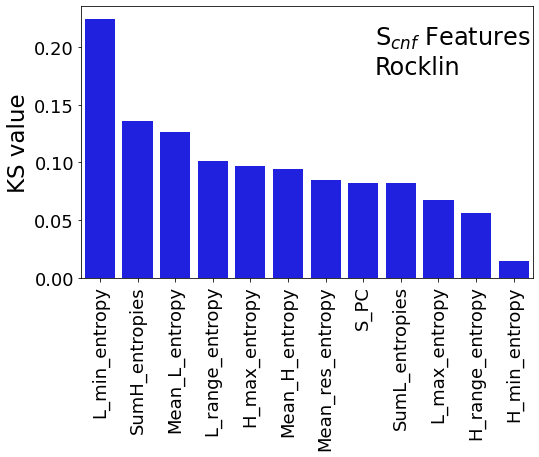

In [68]:
golden = (1 + 5 ** 0.5) / 2

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

sns.barplot(x="Feature",y="KS",data=ks_values_all_spc[ks_values_all_spc["Feature"].isin(non_biased_features)].sort_values(by="KS",ascending=False),color='blue')
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='23')
plt.yticks(fontsize='18')
plt.xticks(fontsize='18')
plt.xlabel("")
plt.text(.65,.75,"S$_{cnf}$ Features\nRocklin",fontsize='24', transform = plt.gca().transAxes)
plt.show()

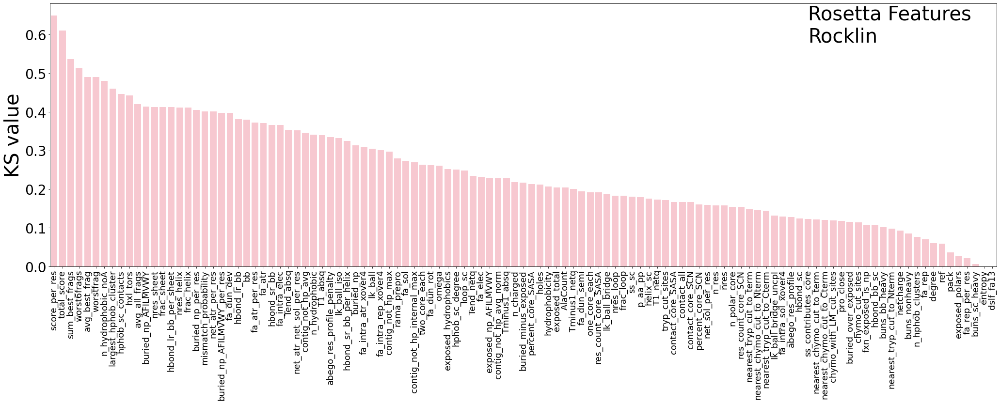

In [69]:
golden = (1 + 5 ** 0.5) / 2

f, __ = plt.subplots(1,1,figsize=[35,10])

sns.barplot(x="Feature",y="KS",data=ks_values_all_ros.sort_values(by="KS",ascending=False),color='pink')
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='40')
plt.yticks(fontsize='28')
plt.xticks(fontsize='18')
plt.xlabel("")
plt.text(90,.58,"Rosetta Features\nRocklin",fontsize='40')
plt.show()

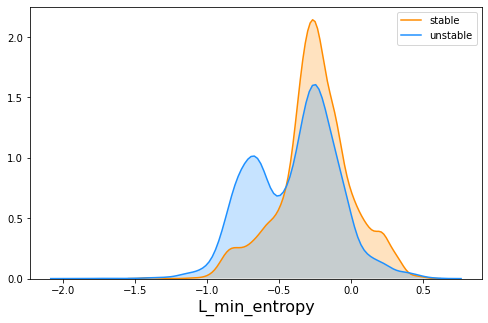

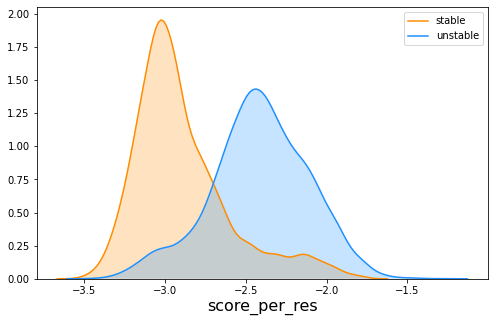

In [70]:
golden = (1 + 5 ** 0.5) / 2
fets = ['L_min_entropy','score_per_res']

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[0]
sns.kdeplot(data=stable_proteins[fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
ax.set_xlabel("%s"%(fet),fontsize='16')

plt.gcf()

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[1]
sns.kdeplot(data=stable_proteins[fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
ax.set_xlabel("%s"%(fet),fontsize='16')

plt.show()

## Longxing

In [71]:
stable_proteins = longxing_df[longxing_df["stabilityscore_cnn_calibrated_2classes"]==1]
unstable_proteins = longxing_df[longxing_df["stabilityscore_cnn_calibrated_2classes"]==0]

#get a list of topologies
topologies_list = list(longxing_df['topology'].unique())


# get KS values for all features
rows = []
for fet in spc_features:
    subset_stable = stable_proteins[fet]
    subset_unstable = unstable_proteins[fet]
    
    ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
    rows.append([fet,ks_value,False,p_value]) #third row corresponds to 'is_rosetta' column

for fet in ros_features:
    subset_stable = stable_proteins[fet]
    subset_unstable = unstable_proteins[fet]
    
    ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
    rows.append([fet,ks_value,True,p_value])

    
    
#make a dataframe from ks value data
ks_values_all = pd.DataFrame(rows,columns=['Feature','KS','is_rosetta','P-value'])

#subset for entropy feature ks values and rosetta feature ks values
ks_values_all_spc = ks_values_all[ks_values_all['is_rosetta']==False]
ks_values_all_ros = ks_values_all[ks_values_all['is_rosetta']==True]


#get index of row with highest ks value for entropy and rosetta feature subset
spc_max_inx = ks_values_all_spc['KS'].idxmax()
ros_max_inx = ks_values_all_ros['KS'].idxmax()

print("Entropy feature with highest KS Value:\n",ks_values_all.iloc[spc_max_inx,:])
print()
print("Rosetta feature with highest KS Value\n",ks_values_all.iloc[ros_max_inx,:])

Entropy feature with highest KS Value:
 Feature       H_max_entropy
KS                 0.166851
is_rosetta            False
P-value         2.25664e-54
Name: 8, dtype: object

Rosetta feature with highest KS Value
 Feature       n_hydrophobic_noA
KS                     0.431153
is_rosetta                 True
P-value                       0
Name: 93, dtype: object


In [72]:
def ks_value_barplot(df,kind='spc'):
    if kind=='spc':
        golden = (1 + 5 ** 0.5) / 2

        f, __ = plt.subplots(1,1,figsize=[5*golden,5])

        sns.barplot(x="Feature",y="KS",data=df.sort_values(by="KS",ascending=False),color='blue')
        plt.xticks(rotation=90)
        plt.ylabel("KS value",fontsize='23')
        plt.ylim(0,.40)
        plt.yticks(fontsize='18')
        plt.xticks(fontsize='18')
        plt.xlabel("")
        plt.text(10,.32,"S$_{cnf}$ Features",fontsize='24')
        plt.show()  
    elif kind=="ros":
        golden = (1 + 5 ** 0.5) / 2

    f, __ = plt.subplots(1,1,figsize=[35,10])

    sns.barplot(x="Feature",y="KS",data=ks_values_all_ros.sort_values(by="KS",ascending=False),color='pink')
    plt.xticks(rotation=90)
    plt.ylabel("KS value",fontsize='40')
    plt.ylim(0,.6)
    plt.yticks(fontsize='28')
    plt.xticks(fontsize='18')
    plt.xlabel("")
    plt.text(90,.50,"Rosetta Features",fontsize='40')
    plt.show()

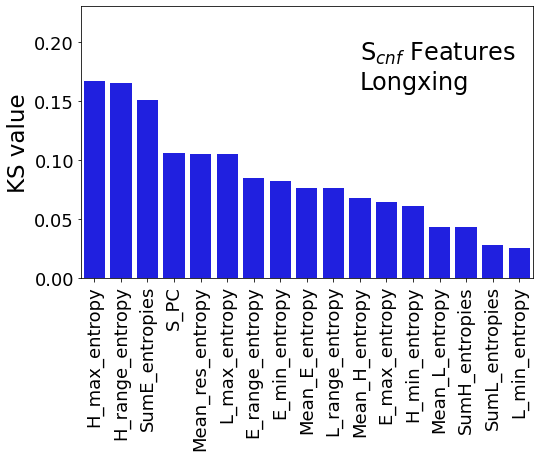

In [75]:
golden = (1 + 5 ** 0.5) / 2

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

sns.barplot(x="Feature",y="KS",data=ks_values_all_spc.sort_values(by="KS",ascending=False),color='blue')
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='23')
plt.ylim(0,.23)
plt.yticks(fontsize='18')
plt.xticks(fontsize='18')
plt.xlabel("")
plt.text(10,.16,"S$_{cnf}$ Features\nLongxing",fontsize='24')
plt.show()

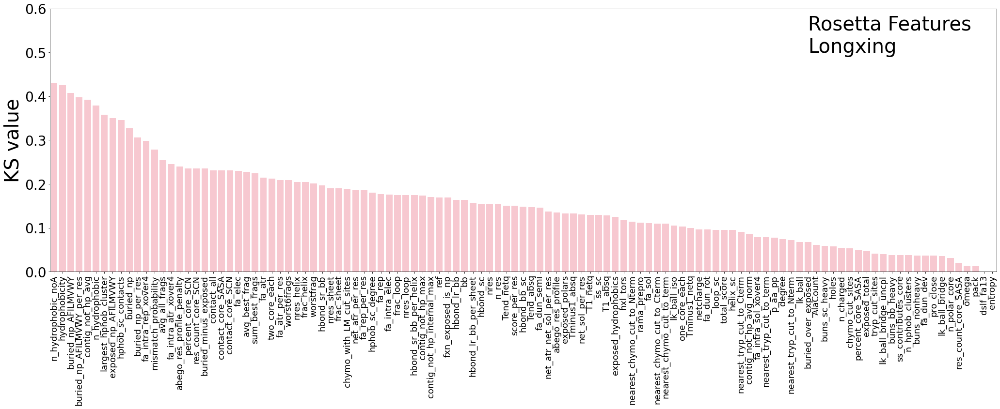

In [76]:
golden = (1 + 5 ** 0.5) / 2

f, __ = plt.subplots(1,1,figsize=[35,10])

sns.barplot(x="Feature",y="KS",data=ks_values_all_ros.sort_values(by="KS",ascending=False),color='pink')
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='40')
plt.ylim(0,.6)
plt.yticks(fontsize='28')
plt.xticks(fontsize='18')
plt.xlabel("")
plt.text(90,.50,"Rosetta Features\nLongxing",fontsize='40')
plt.show()

**IMPORTANT**: although `n_hydrophobic_noA` has highest KS value, due to the discreet nature of that data the KS test will not be good. I chose to visualize the next best: total_score

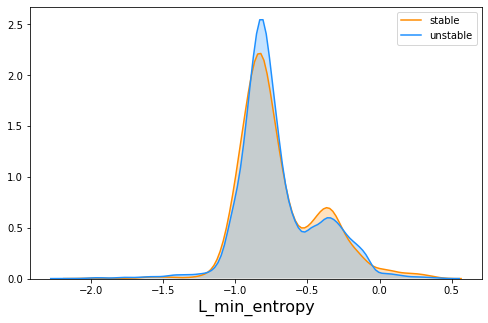

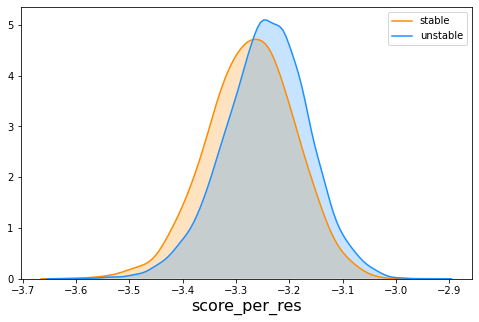

In [77]:
golden = (1 + 5 ** 0.5) / 2
#fets = ['H_max_entropy','hydrophobicity']
fets = ['L_min_entropy','score_per_res']

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[0]
sns.kdeplot(data=stable_proteins[fet],label='stable',color='darkorange',shade='fill')
sns.kdeplot(data=unstable_proteins[fet],label='unstable',color='dodgerblue',shade='fill')
ax = plt.gca()
ax.set_xlabel("%s"%(fet),fontsize='16')
plt.legend()

plt.gcf()

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[1]
sns.kdeplot(data=stable_proteins[fet],label='stable',color='darkorange',shade='fill')
sns.kdeplot(data=unstable_proteins[fet],label='unstable',color='dodgerblue',shade='fill')
ax = plt.gca()
ax.set_xlabel("%s"%(fet),fontsize='16')
plt.legend()

plt.show()

# KS value comparison (Topology specific)

### Rocklin

In [78]:
stable_proteins = rocklin_df[rocklin_df["stabilityscore_cnn_calibrated_2classes"]==1]
unstable_proteins = rocklin_df[rocklin_df["stabilityscore_cnn_calibrated_2classes"]==0]

#get a list of topologies
topologies_list = list(rocklin_df['topology'].unique())



rows = []

for topology in topologies_list:
    stable_top_specific = stable_proteins[stable_proteins['topology']==topology]
    unstable_top_specific = unstable_proteins[unstable_proteins['topology']==topology]
    

    for fet in spc_features:
        subset_stable = stable_top_specific[fet]
        subset_unstable = unstable_top_specific[fet]

        ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
        rows.append([fet,ks_value,False,topology,p_value]) #third row corresponds to 'is_rosetta' column

    for fet in ros_features:
        subset_stable = stable_top_specific[fet]
        subset_unstable = unstable_top_specific[fet]

        ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
        rows.append([fet,ks_value,True,topology,p_value])
    
    

In [79]:
ks_values_topology = pd.DataFrame(rows,columns=['Feature','KS','is_rosetta','topology','P-value'])
ks_values_topology_spc = ks_values_topology[ks_values_topology['is_rosetta']==False].reset_index(drop=True)
ks_values_topology_ros = ks_values_topology[ks_values_topology['is_rosetta']==True].reset_index(drop=True)

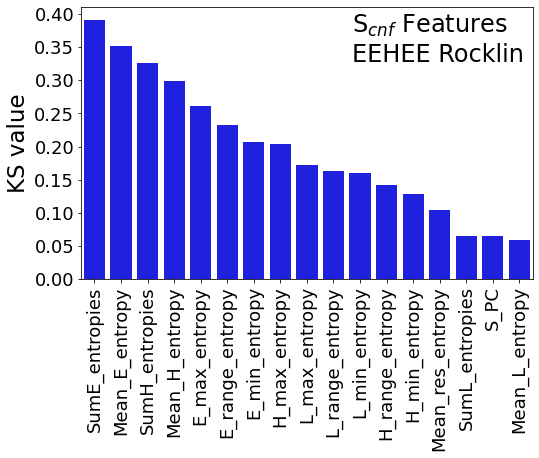

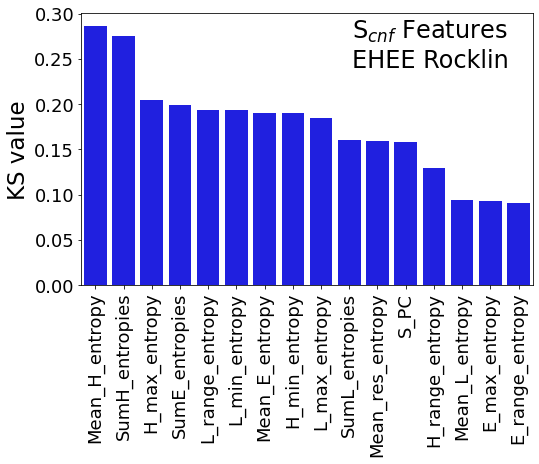

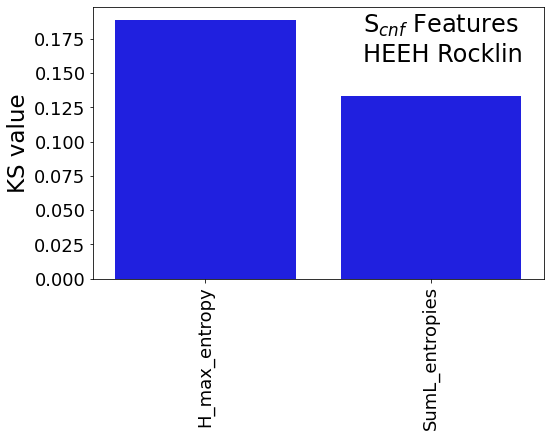

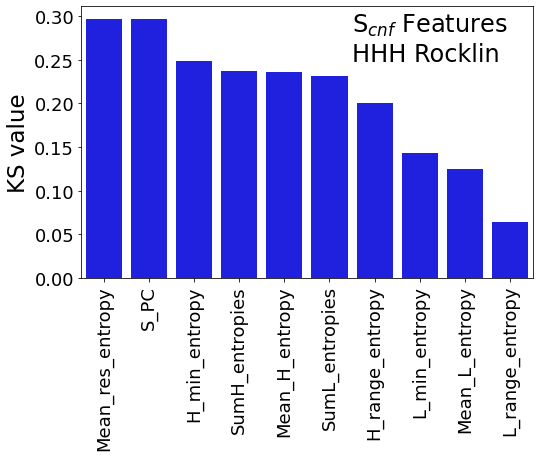

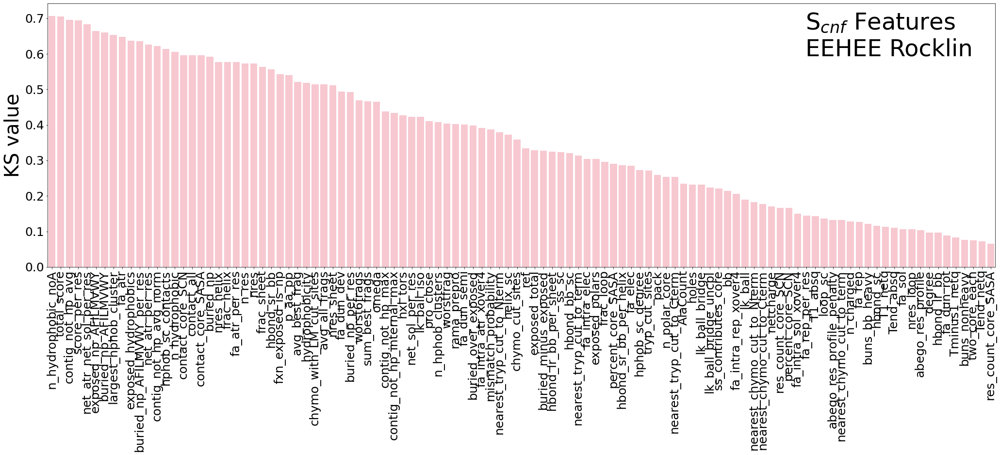

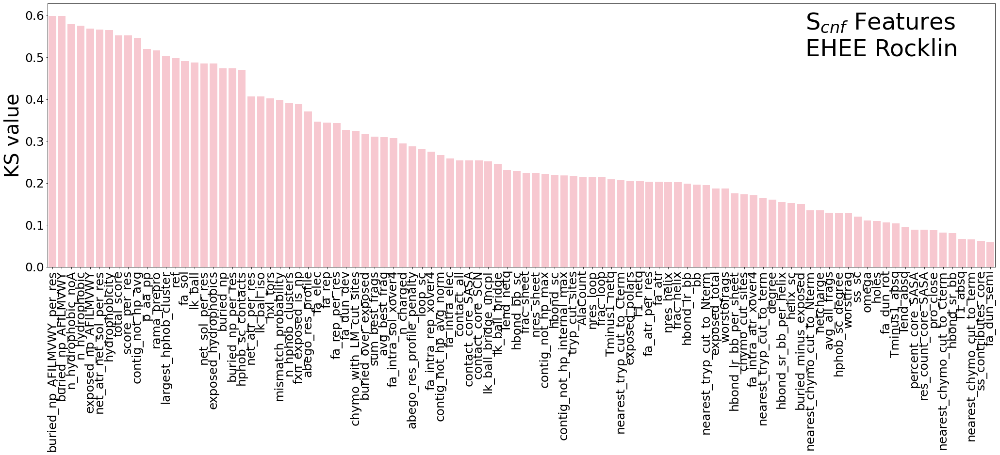

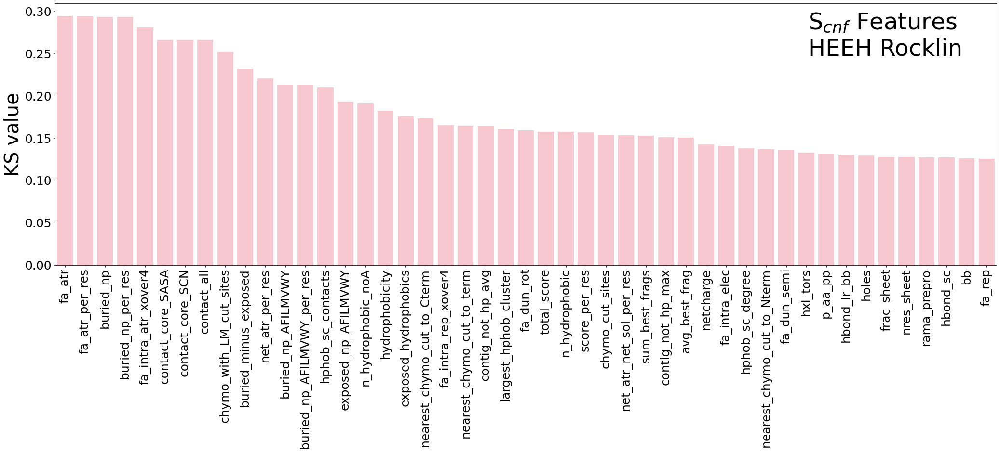

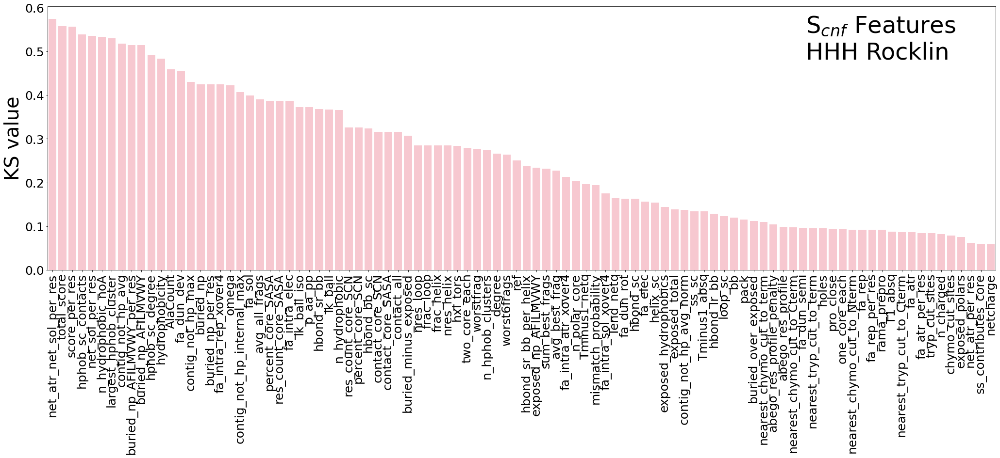

In [80]:
#show entropy features ranked by KS value for each topology.
df = ks_values_topology_spc[ks_values_topology_spc['P-value']<.05].sort_values(by='KS',ascending=False)
for topology in topologies_list:
    #print("\t TOPOLOGY --> %s"%topology)
    #print(df[df['topology']==topology])
    
    
    f, __ = plt.subplots(1,1,figsize=[5*golden,5])

    sns.barplot(x="Feature",y="KS",data=df[df['topology']==topology].sort_values(
                                        by="KS",ascending=False),color='blue')
    plt.xticks(rotation=90)
    plt.ylabel("KS value",fontsize='23')
    plt.yticks(fontsize='18')
    plt.xticks(fontsize='18')
    plt.xlabel("")
    plt.text(.6,.8,"S$_{cnf}$ Features\n%s Rocklin"%(topology),fontsize='24',transform=plt.gca().transAxes)
    plt.show()
    
    
    print()

#show Rosetta features ranked by KS value for each topology.
df = ks_values_topology_ros[ks_values_topology_ros['P-value']<.05].sort_values(by='KS',ascending=False)
for topology in topologies_list:
#     print("\t TOPOLOGY --> %s"%topology)
#     print(df[df['topology']==topology].iloc[:20,:])
    
    golden = (1 + 5 ** 0.5) / 2

    f, __ = plt.subplots(1,1,figsize=[35,10])

    sns.barplot(x="Feature",y="KS",data=df[df['topology']==topology].sort_values(
                            by="KS",ascending=False),color='pink')
    plt.xticks(rotation=90)
    plt.ylabel("KS value",fontsize='40')
    plt.yticks(fontsize='25')
    plt.xticks(fontsize='25')
    plt.xlabel("")
    plt.text(.8,.8,"S$_{cnf}$ Features\n%s Rocklin"%(topology),fontsize='48',transform=plt.gca().transAxes)
    plt.show()
    
    
    print()

In [81]:
# Highest KS value for Entropy Feature in a topology:
spc_max_inx = ks_values_topology_spc['KS'].idxmax()

# Highest KS value for Rosetta Feature in a topology:
ros_max_inx = ks_values_topology_ros['KS'].idxmax()

print("Entropy feature-topology pair with highest KS Value:\n",ks_values_topology_spc.iloc[spc_max_inx,:])
print()
print("Rosetta feature-topology pair with highest KS Value\n",ks_values_topology_ros.iloc[ros_max_inx,:])

Entropy feature-topology pair with highest KS Value:
 Feature       SumE_entropies
KS                  0.390694
is_rosetta             False
topology               EEHEE
P-value          1.28803e-68
Name: 7, dtype: object

Rosetta feature-topology pair with highest KS Value
 Feature       n_hydrophobic_noA
KS                     0.706337
is_rosetta                 True
topology                  EEHEE
P-value            2.61375e-223
Name: 76, dtype: object


**IMPORTANT**: although `n_hydrophobic_noA` has highest KS value, due to the discreet nature of that data the KS test will not be good. I chose to visualize the next best: total_score

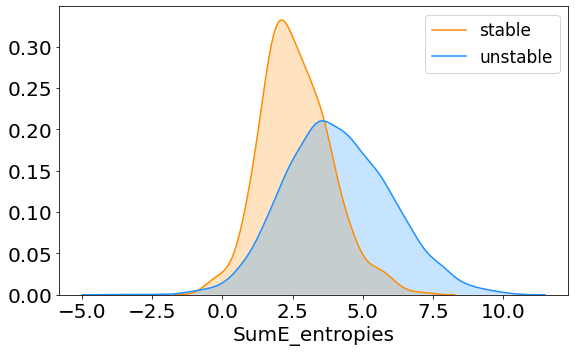

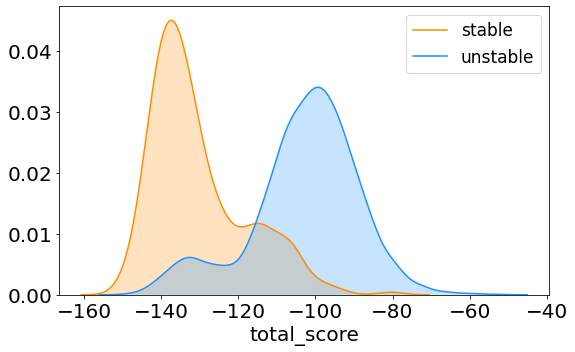

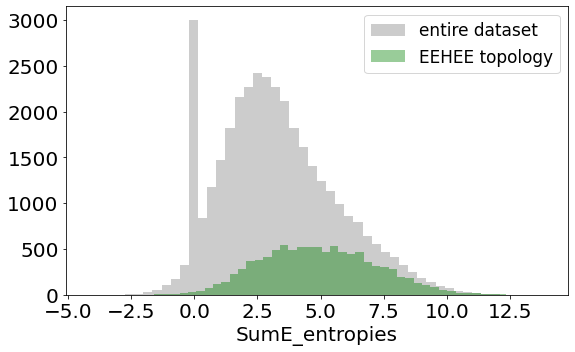

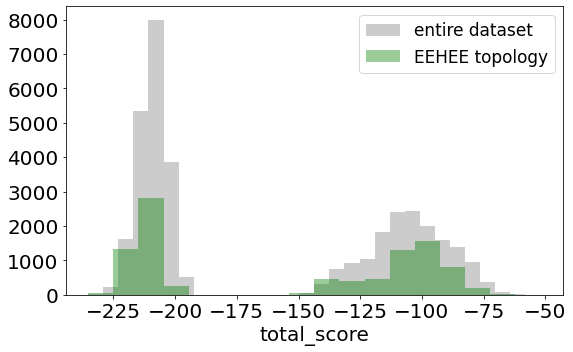

In [82]:
golden = (1 + 5 ** 0.5) / 2
fets = ['SumE_entropies','total_score']
top = "EEHEE"

### show kde plots for figures

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[0]
sns.kdeplot(data=stable_proteins[stable_proteins['topology']==top][fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[unstable_proteins['topology']==top][fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3d.png",dpi=300,bbox_anchor="tight")

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[1]
sns.kdeplot(data=stable_proteins[stable_proteins['topology']==top][fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[unstable_proteins['topology']==top][fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3c.png",dpi=300,bbox_anchor="tight")


### show distributions for plots
fet = fets[0]
f, __ = plt.subplots(1,1,figsize=[5*golden,5])
sns.distplot(data[fet].values,label="entire dataset",color='gray',kde=False)
sns.distplot(data[data['topology']==top][fet].values,label='EEHEE topology',color='green',kde=False)
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3e.png",dpi=300,bbox_anchor="tight")

fet = fets[1]
f, __ = plt.subplots(1,1,figsize=[5*golden,5])
sns.distplot(data[fet].values,label="entire dataset",color='gray',kde=False)
sns.distplot(data[data['topology']==top][fet].values,label='EEHEE topology',color='green',kde=False)
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3f.png",dpi=300,bbox_anchor="tight")

plt.show()

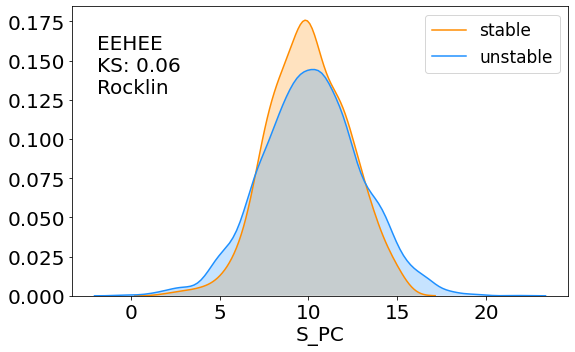

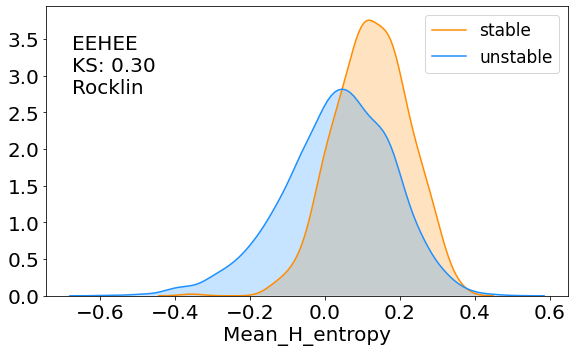

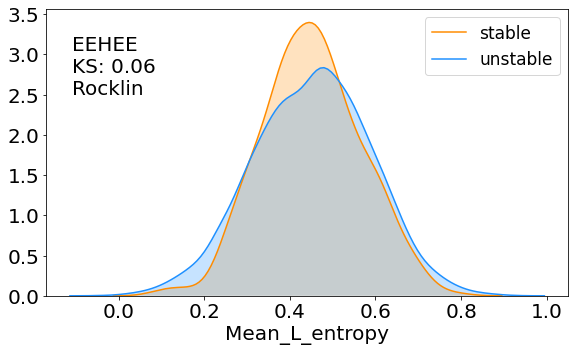

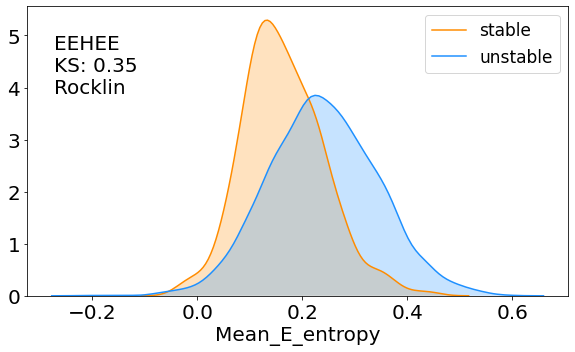

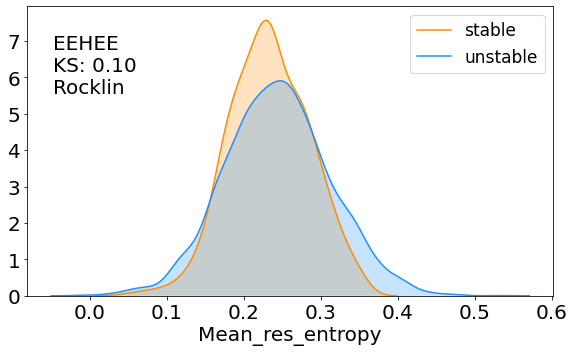

...

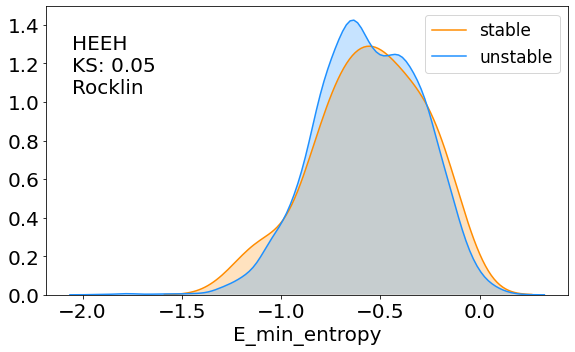

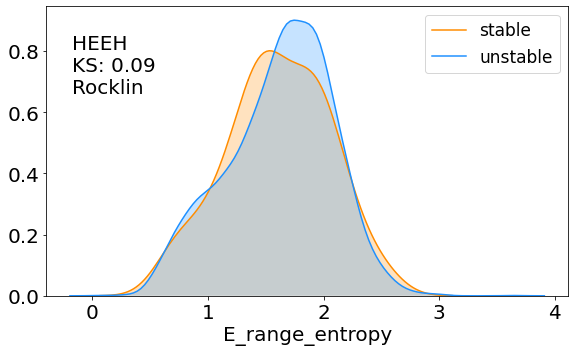

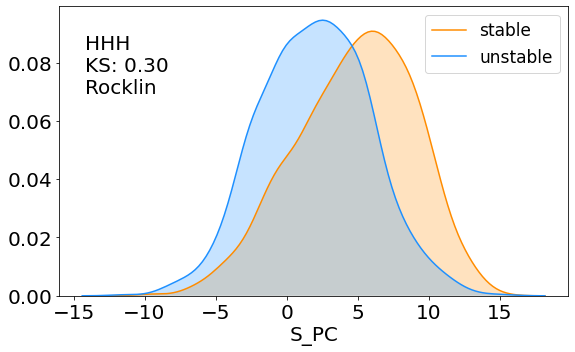

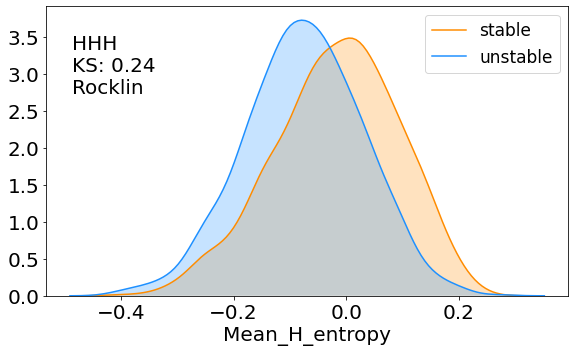

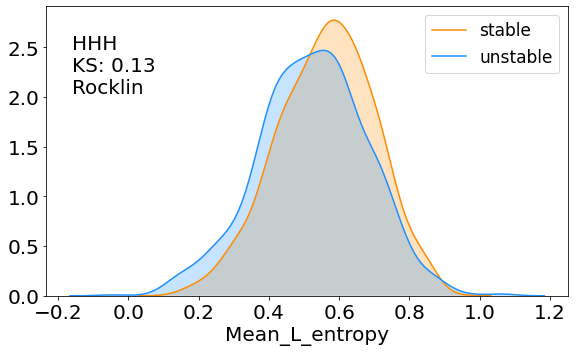

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


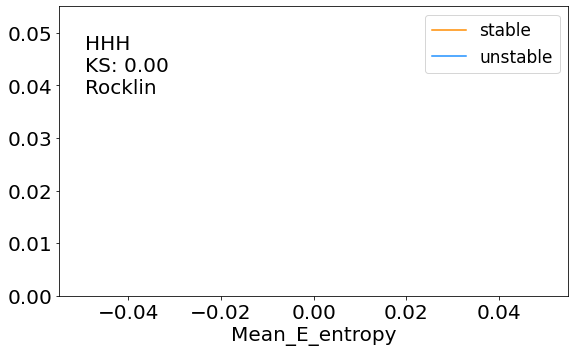

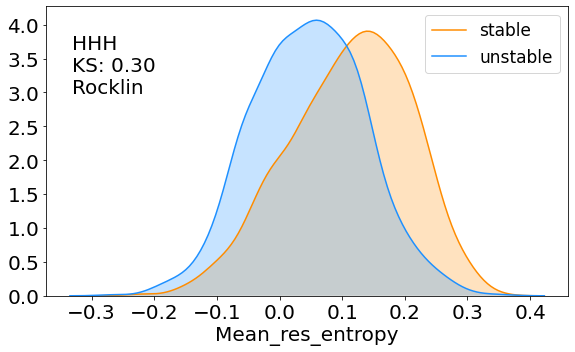

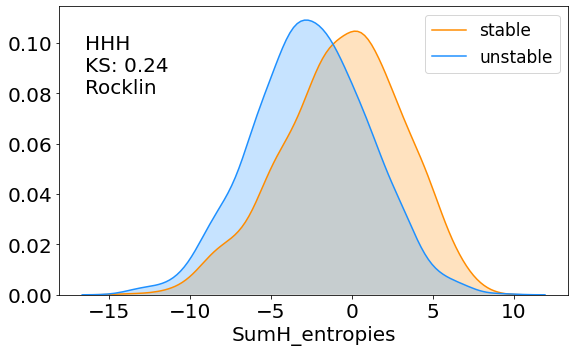

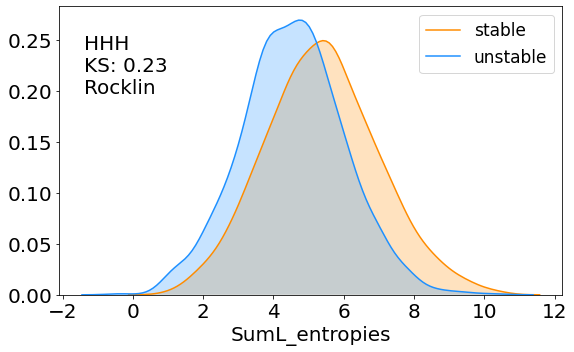

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


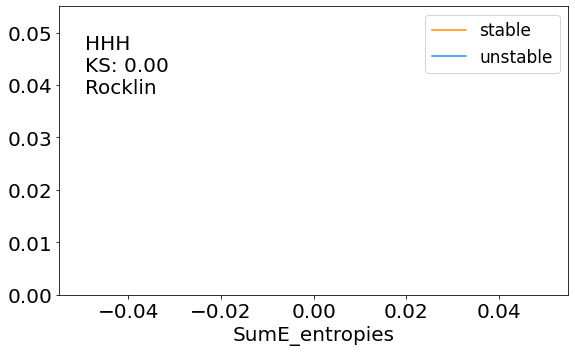

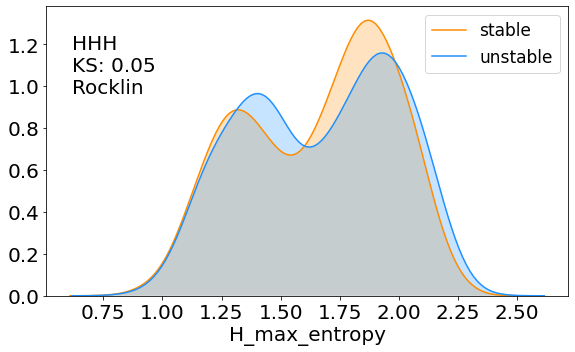

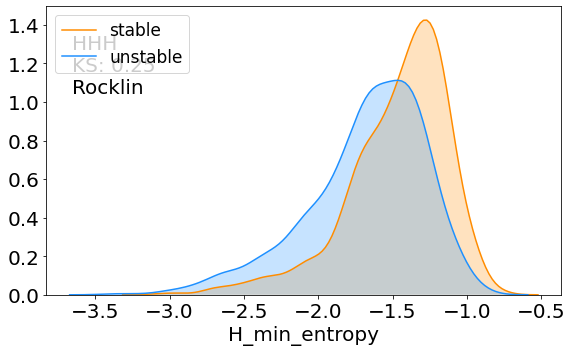

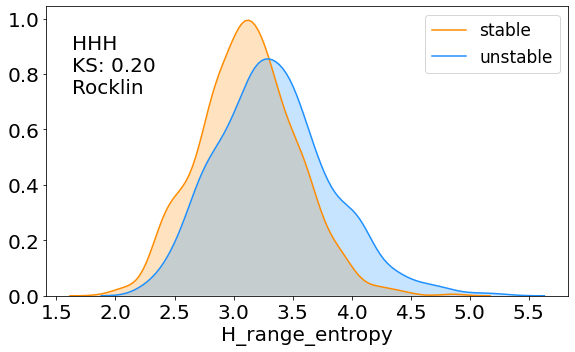

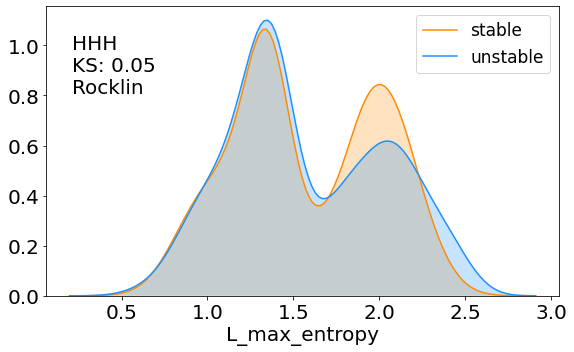

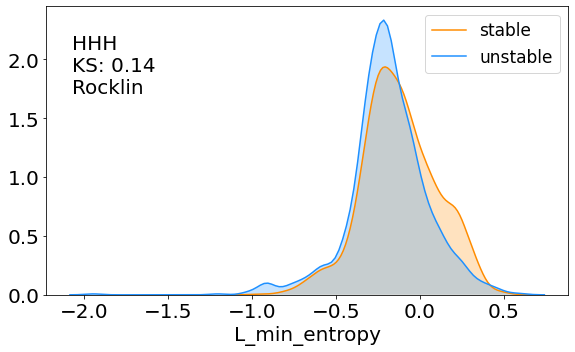

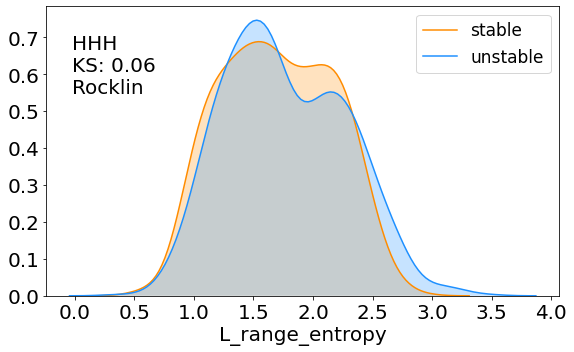

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


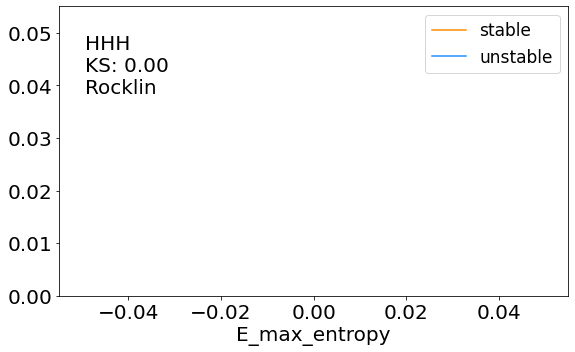

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


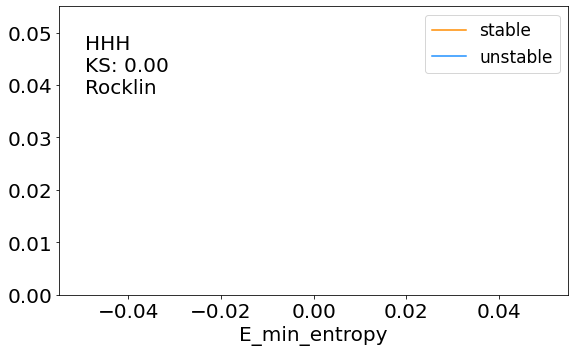

/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


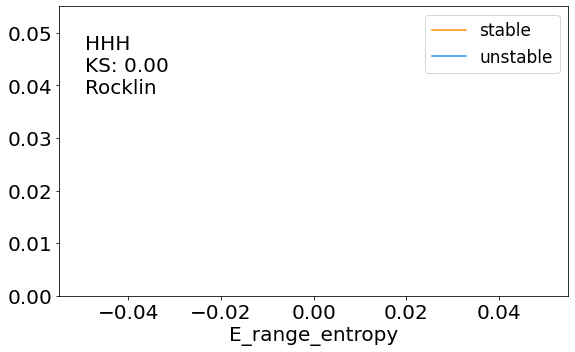

In [83]:
golden = (1 + 5 ** 0.5) / 2
fets = spc_features
tops = topologies_list

for i in range(len(tops)):
    top = tops[i]
    for j in range(len(fets)):
        ### show kde plots for figures
        fet = fets[j]
        
        f, __ = plt.subplots(1,1,figsize=[5*golden,5])

        stables = stable_proteins[stable_proteins['topology']==top][fet]
        unstables = unstable_proteins[unstable_proteins['topology']==top][fet]


        sns.kdeplot(data=stables,label='stable',shade=True,color='darkorange')
        sns.kdeplot(data=unstables,label='unstable',shade=True,color='dodgerblue')
        ax = plt.gca()
        plt.yticks(fontsize="20")
        plt.xticks(fontsize="20")
        ax.set_xlabel("%s"%(fet),fontsize='20')
        plt.legend(fontsize='17')
        plt.text(.05,.70,
                "%s\nKS: %0.2f\nRocklin"%(top,ks_2samp(stables,unstables)[0]),
                 transform=plt.gca().transAxes,
                fontsize='20')
        plt.tight_layout()
        plt.show()
        plt.close('all')


In [84]:
# store KS value results for rocklin in a separate variable for final plot

ks_values_top_rocklin_spc = ks_values_topology_spc
ks_values_top_rocklin_spc['dataset'] = ["Rocklin"]*len(ks_values_top_rocklin_spc) # tag df with 'Rocklin'

### Longxing

In [85]:
stable_proteins = longxing_df[longxing_df["stabilityscore_cnn_calibrated_2classes"]==1]
unstable_proteins = longxing_df[longxing_df["stabilityscore_cnn_calibrated_2classes"]==0]


#get a list of topologies
topologies_list = list(longxing_df['topology'].unique())


In [86]:
rows = []

for topology in topologies_list:
    stable_top_specific = stable_proteins[stable_proteins['topology']==topology]
    unstable_top_specific = unstable_proteins[unstable_proteins['topology']==topology]
    

    for fet in spc_features:
        subset_stable = stable_top_specific[fet]
        subset_unstable = unstable_top_specific[fet]

        ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
        rows.append([fet,ks_value,False,topology,p_value]) #third row corresponds to 'is_rosetta' column

    for fet in ros_features:
        subset_stable = stable_top_specific[fet]
        subset_unstable = unstable_top_specific[fet]

        ks_value, p_value = ks_2samp(subset_stable,subset_unstable)
        rows.append([fet,ks_value,True,topology,p_value])
    

In [87]:
ks_values_topology = pd.DataFrame(rows,columns=['Feature','KS','is_rosetta','topology','P-value'])
ks_values_topology_spc = ks_values_topology[ks_values_topology['is_rosetta']==False].reset_index(drop=True)
ks_values_topology_ros = ks_values_topology[ks_values_topology['is_rosetta']==True].reset_index(drop=True)

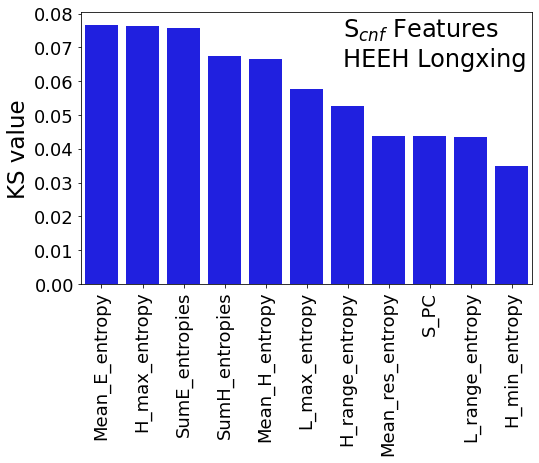

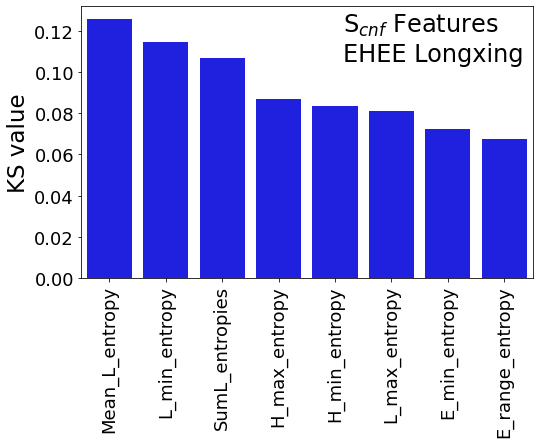

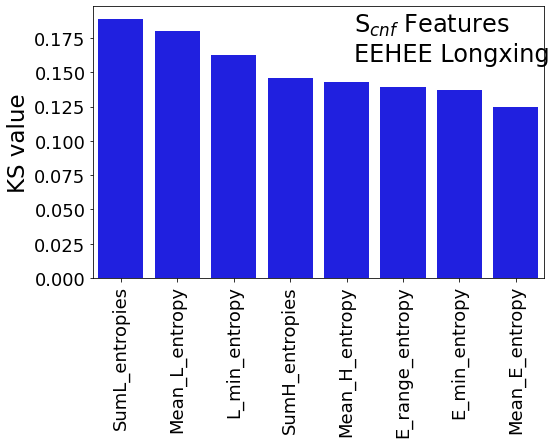

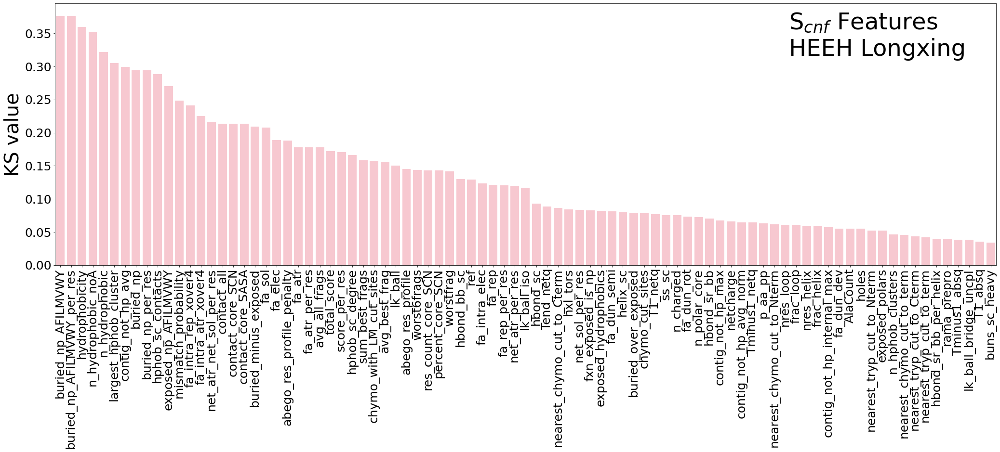

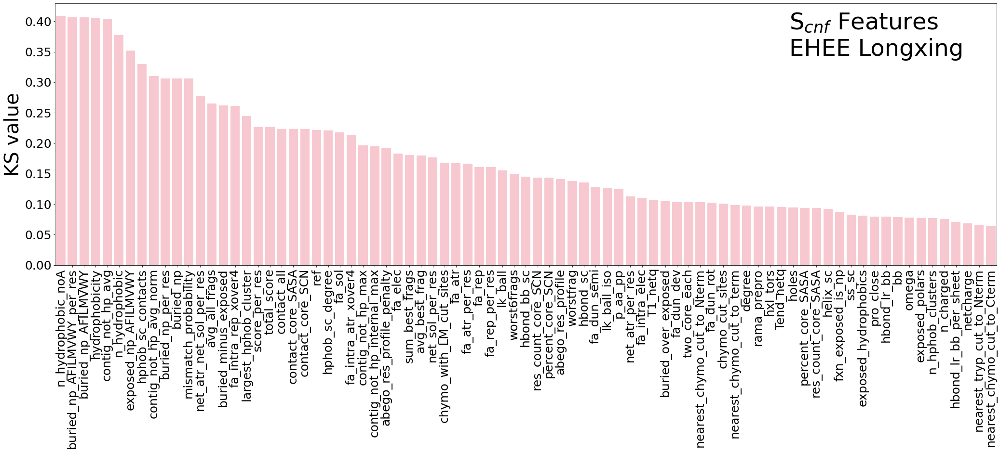

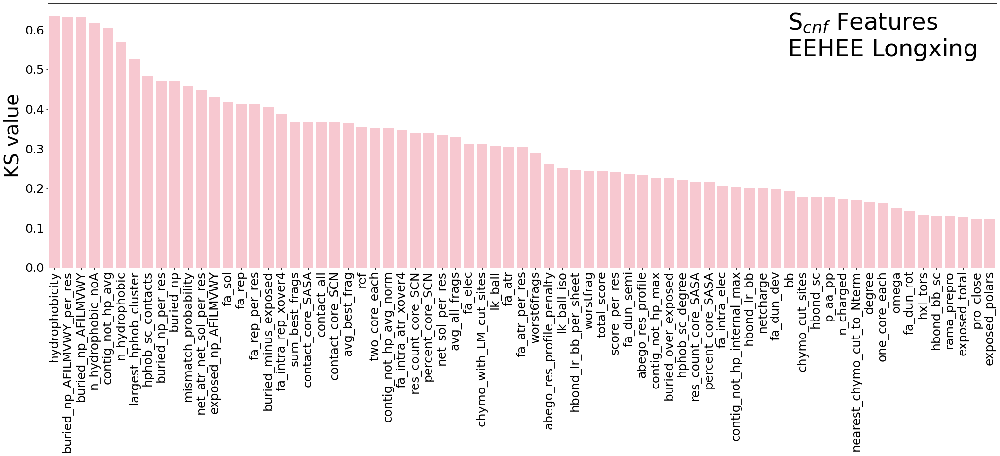

In [90]:
#show entropy features ranked by KS value for each topology.
df = ks_values_topology_spc[ks_values_topology_spc['P-value']<.05].sort_values(by='KS',ascending=False)
for topology in topologies_list:
    #print("\t TOPOLOGY --> %s"%topology)
    #print(df[df['topology']==topology])
    
    
    f, __ = plt.subplots(1,1,figsize=[5*golden,5])

    sns.barplot(x="Feature",y="KS",data=df[df['topology']==topology].sort_values(
                                        by="KS",ascending=False),color='blue')
    plt.xticks(rotation=90)
    plt.ylabel("KS value",fontsize='23')
    plt.yticks(fontsize='18')
    plt.xticks(fontsize='18')
    plt.xlabel("")
    plt.text(.58,.8,"S$_{cnf}$ Features\n%s Longxing"%(topology),fontsize='24',transform=plt.gca().transAxes)
    plt.show()
    
    print()

#show Rosetta features ranked by KS value for each topology.
df = ks_values_topology_ros[ks_values_topology_ros['P-value']<.05].sort_values(by='KS',ascending=False)
for topology in topologies_list:
#     print("\t TOPOLOGY --> %s"%topology)
#     print(df[df['topology']==topology].iloc[:20,:])
    
    golden = (1 + 5 ** 0.5) / 2

    f, __ = plt.subplots(1,1,figsize=[35,10])

    sns.barplot(x="Feature",y="KS",data=df[df['topology']==topology].sort_values(
                            by="KS",ascending=False),color='pink')
    plt.xticks(rotation=90)
    plt.ylabel("KS value",fontsize='40')
    plt.yticks(fontsize='25')
    plt.xticks(fontsize='25')
    plt.xlabel("")
    plt.text(.78,.8,"S$_{cnf}$ Features\n%s Longxing"%(topology),fontsize='48',transform=plt.gca().transAxes)
    plt.show()
    
    
    print()

In [91]:
print("Entropy feature-topology pair with highest KS Value:\n",ks_values_topology_spc.iloc[spc_max_inx,:])
print()
print("Rosetta feature-topology pair with highest KS Value\n",ks_values_topology_ros.iloc[ros_max_inx,:])

Entropy feature-topology pair with highest KS Value:
 Feature       SumE_entropies
KS                 0.0758785
is_rosetta             False
topology                HEEH
P-value          1.96909e-08
Name: 7, dtype: object

Rosetta feature-topology pair with highest KS Value
 Feature       n_hydrophobic_noA
KS                     0.352611
is_rosetta                 True
topology                   HEEH
P-value            2.48234e-173
Name: 76, dtype: object


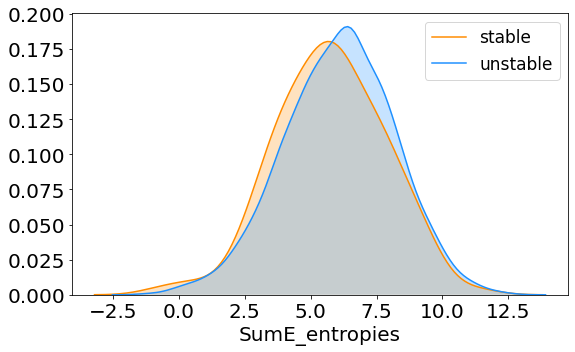

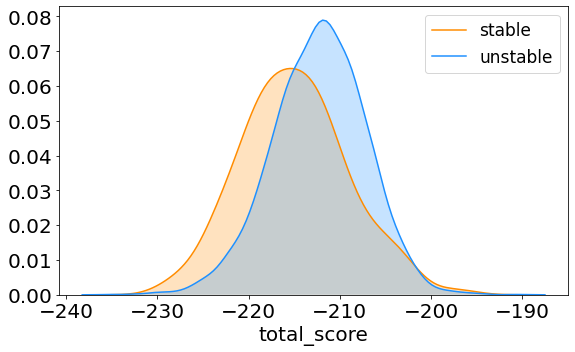

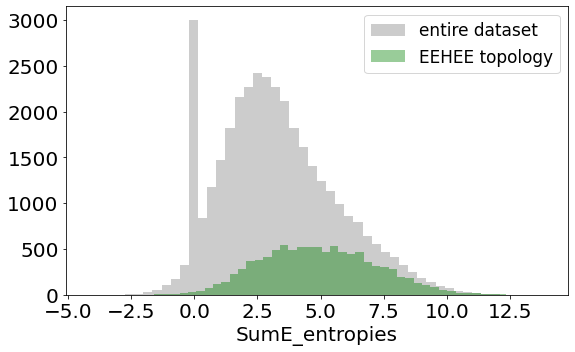

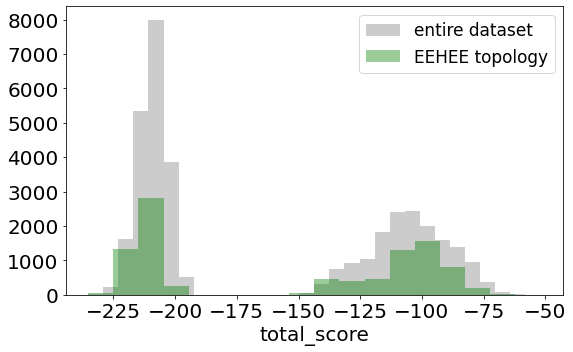

In [92]:
golden = (1 + 5 ** 0.5) / 2
#fets = ['SumL_entropies','hydrophobicity']
fets = ['SumE_entropies','total_score']
top = "EEHEE"

### show kde plots for figures

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[0]
sns.kdeplot(data=stable_proteins[stable_proteins['topology']==top][fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[unstable_proteins['topology']==top][fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3d.png",dpi=300,bbox_anchor="tight")

f, __ = plt.subplots(1,1,figsize=[5*golden,5])

fet = fets[1]
sns.kdeplot(data=stable_proteins[stable_proteins['topology']==top][fet],label='stable',shade=True,color='darkorange')
sns.kdeplot(data=unstable_proteins[unstable_proteins['topology']==top][fet],label='unstable',shade=True,color='dodgerblue')
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3c.png",dpi=300,bbox_anchor="tight")


### show distributions for plots
fet = fets[0]
f, __ = plt.subplots(1,1,figsize=[5*golden,5])
sns.distplot(data[fet].values,label="entire dataset",color='gray',kde=False)
sns.distplot(data[data['topology']==top][fet].values,label='EEHEE topology',color='green',kde=False)
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3e.png",dpi=300,bbox_anchor="tight")

fet = fets[1]
f, __ = plt.subplots(1,1,figsize=[5*golden,5])
sns.distplot(data[fet].values,label="entire dataset",color='gray',kde=False)
sns.distplot(data[data['topology']==top][fet].values,label='EEHEE topology',color='green',kde=False)
ax = plt.gca()
plt.yticks(fontsize="20")
plt.xticks(fontsize="20")
ax.set_xlabel("%s"%(fet),fontsize='20')
plt.legend(fontsize='17')
plt.tight_layout()

#plt.savefig("./SavedFigures/Figure3f.png",dpi=300,bbox_anchor="tight")

plt.show()

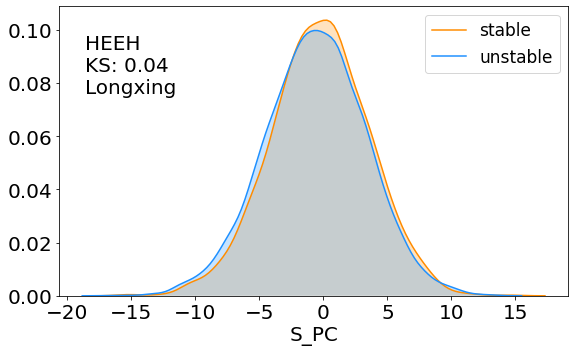

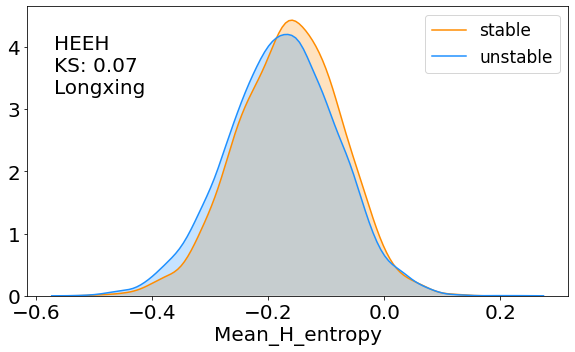

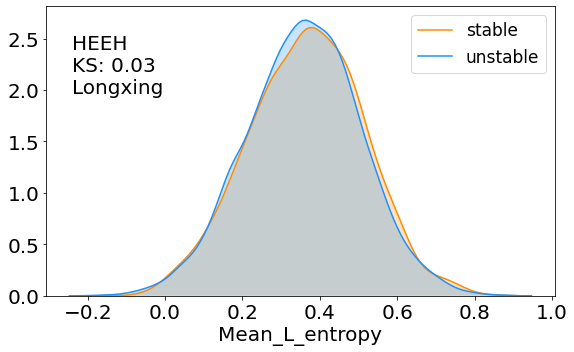

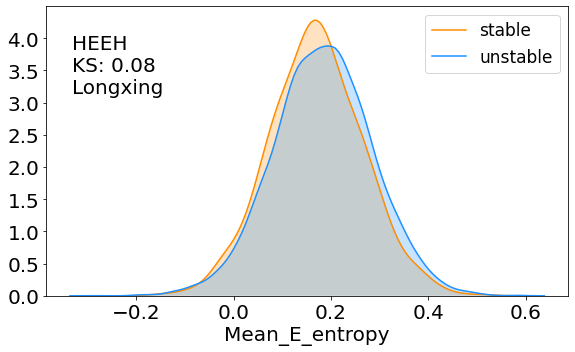

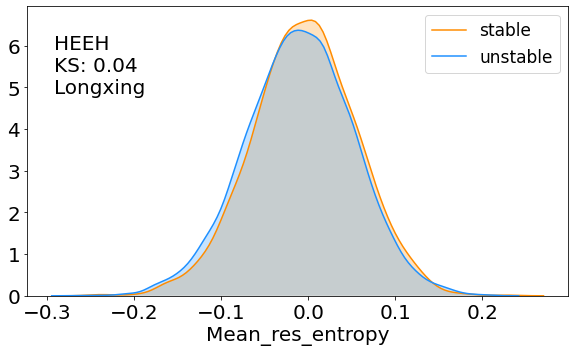

...

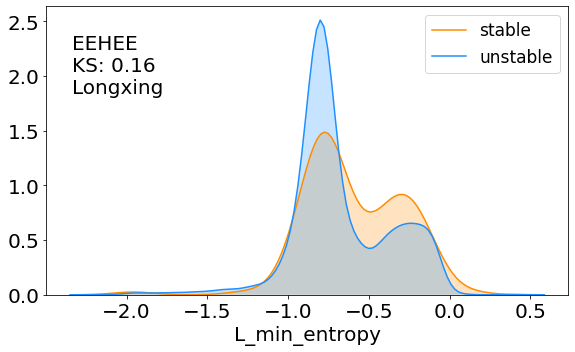

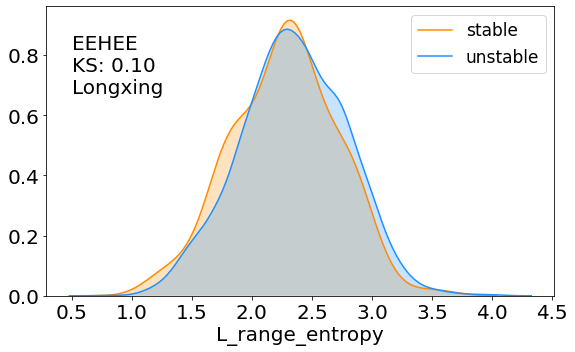

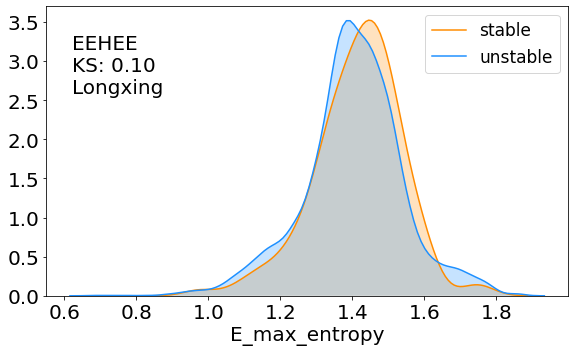

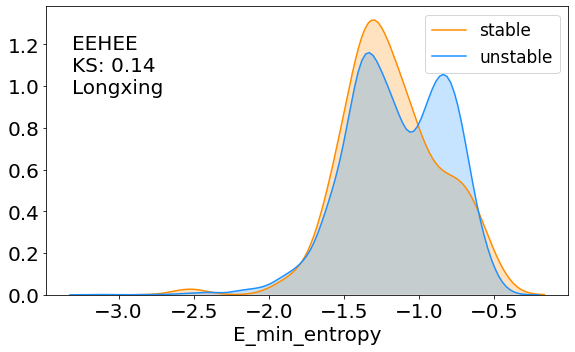

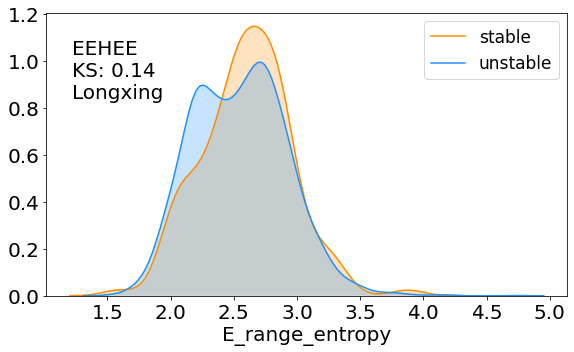

In [93]:
golden = (1 + 5 ** 0.5) / 2
fets = spc_features
tops = topologies_list

for i in range(len(tops)):
    top = tops[i]
    for j in range(len(fets)):
        fet = fets[j]
        ### show kde plots for figures

        f, __ = plt.subplots(1,1,figsize=[5*golden,5])

        stables = stable_proteins[stable_proteins['topology']==top][fet]
        unstables = unstable_proteins[unstable_proteins['topology']==top][fet]


        
        sns.kdeplot(data=stables,label='stable',shade=True,color='darkorange')
        sns.kdeplot(data=unstables,label='unstable',shade=True,color='dodgerblue')
        ax = plt.gca()
        plt.yticks(fontsize="20")
        plt.xticks(fontsize="20")
        ax.set_xlabel("%s"%(fet),fontsize='20')
        plt.legend(fontsize='17')
        plt.text(.05,.70,
                "%s\nKS: %0.2f\nLongxing"%(top,ks_2samp(stables,unstables)[0]),
                 transform=plt.gca().transAxes,
                fontsize='20')
        plt.tight_layout()
        plt.show()
        plt.close('all')


In [94]:
# store KS value results for longxing in a separate variable for final plot

ks_values_top_longxing_spc = ks_values_topology_spc
ks_values_top_longxing_spc['dataset'] = ["Longxing"]*len(ks_values_top_longxing_spc) # tag df with 'longxing'

## Custom Plot (for heatmap including Rosetta and Entropy features)

In [95]:
# add a column as a string tag for what dataset+topology + feature each row belongs to

ks_values_top_rocklin_spc["Full Tag"] = "R-"+ks_values_top_rocklin_spc["topology"]+" "+ks_values_top_rocklin_spc['Feature']

ks_values_top_longxing_spc["Full Tag"] = "L-"+ks_values_top_longxing_spc["topology"]+" "+ks_values_top_longxing_spc['Feature']

In [96]:
df_total = pd.concat([ks_values_top_rocklin_spc,ks_values_top_longxing_spc], axis=0)

In [97]:
# the order in which i want to plot the data
order_cols = ["L-EHEE L_min_entropy","R-EEHEE L_min_entropy",
             "R-HEEH SumL_entropies","L-EEHEE SumL_entropies",
             "L-HEEH SumL_entropies",
             "R-EEHEE L_max_entropy","R-HEEH L_max_entropy",
             "R-EEHEE SumE_entropies","L-EHEE SumE_entropies",
             "R-HHH S_PC"]

sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Full Tag"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

Text(0.5, 0, '')

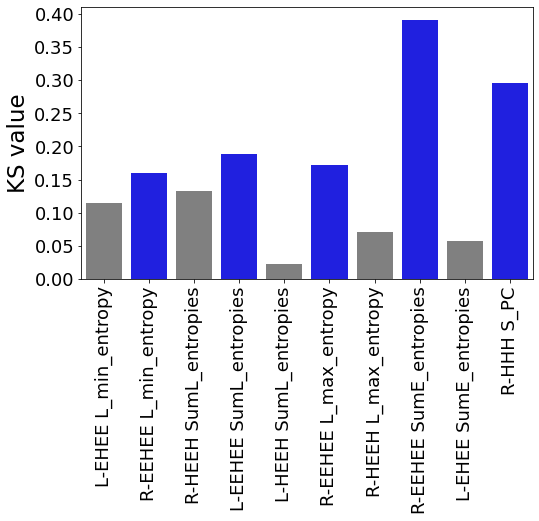

In [98]:
f, __ = plt.subplots(1,1,figsize=[5*golden,5])


palette_list = ["gray","blue"]*5

g = sns.barplot(x="Full Tag",y="KS",data=sorted_df_total, palette=palette_list)
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='23')
plt.yticks(fontsize='18')
plt.xticks(fontsize='18')
plt.xlabel("")
#plt.text(.10,.8,"S$_{cnf}$ Features\n%s Longxing"%(topology),fontsize='24',transform=plt.gca().transAxes)
#plt.show()
    

## Custom Plot (for heatmap inlcuding only Entropy features)

In [99]:
# add a column as a string tag for what dataset+topology + feature each row belongs to

ks_values_top_rocklin_spc["Full Tag"] = "R-"+ks_values_top_rocklin_spc["topology"]+" "+ks_values_top_rocklin_spc['Feature']

ks_values_top_longxing_spc["Full Tag"] = "L-"+ks_values_top_longxing_spc["topology"]+" "+ks_values_top_longxing_spc['Feature']

df_total = pd.concat([ks_values_top_rocklin_spc,ks_values_top_longxing_spc], axis=0)

# the order in which i want to plot the data
order_cols = ["L-EEHEE Mean_E_entropy","R-EEHEE Mean_E_entropy",
             "R-HHH Mean_L_entropy","L-EEHEE Mean_L_entropy",
              "R-EEHEE SumE_entropies",
              "L-EEHEE SumL_entropies",            
             "R-EEHEE L_max_entropy","R-HHH L_max_entropy",
              "R-HEEH H_range_entropy","L-EEHEE H_range_entropy",
              "L-HEEH Mean_H_entropy","L-EHEE Mean_H_entropy",
              "L-HEEH L_max_entropy", "R-EEHEE L_max_entropy"
             ]

sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Full Tag"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

Text(0.5, 0, '')

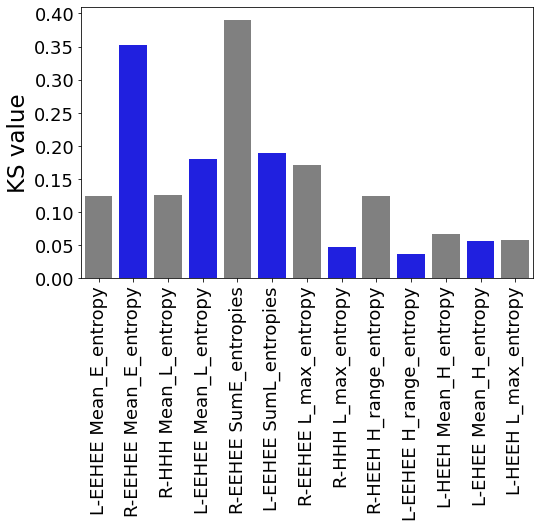

In [100]:
f, __ = plt.subplots(1,1,figsize=[5*golden,5])


palette_list = ["gray","blue"]*5

g = sns.barplot(x="Full Tag",y="KS",data=sorted_df_total, palette=palette_list)
plt.xticks(rotation=90)
plt.ylabel("KS value",fontsize='23')
plt.yticks(fontsize='18')
plt.xticks(fontsize='18')
plt.xlabel("")
#plt.text(.50,.8,"S$_{cnf}$ Features\n%s Longxing"%(topology),fontsize='24',transform=plt.gca().transAxes)
#plt.show()
    

## Custom Plot (for heatmap inlcuding only Rocklin Entropy features)

In [101]:
# add a column as a string tag for what dataset+topology + feature each row belongs to

ks_values_top_rocklin_spc["Full Tag"] = ks_values_top_rocklin_spc["topology"]+" "+ks_values_top_rocklin_spc['Feature']

#ks_values_top_longxing_spc["Full Tag"] = "L-"+ks_values_top_longxing_spc["topology"]+" "+ks_values_top_longxing_spc['Feature']

df_total = ks_values_top_rocklin_spc

# the order in which i want to plot the data
order_cols = [
            "HHH SumH_entropies","EEHEE SumH_entropies",
            "EEHEE SumE_entropies",        
             "EHEE L_min_entropy","HEEH L_min_entropy",
             ]

sorted_fragments_df = []

for col in order_cols:
    # append the fragment of the dataframe that corresponds to the feature column
    sorted_fragments_df.append(
            df_total[df_total["Full Tag"]==col]
    )
                      
        
        
        
sorted_df_total = pd.concat(sorted_fragments_df,axis=0)

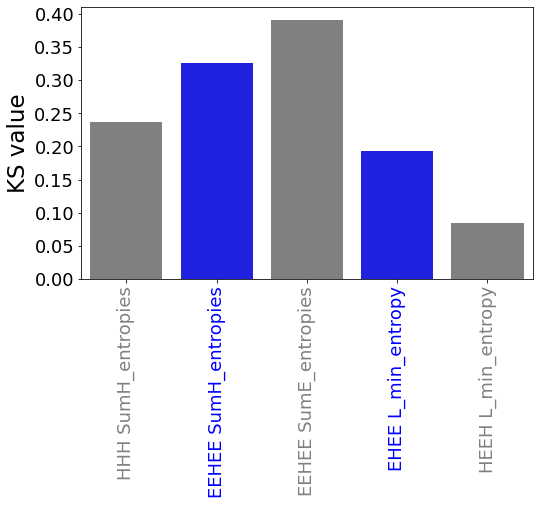

In [102]:
f, __ = plt.subplots(1,1,figsize=[5*golden,5])


palette_list = ["gray","blue"]*5

g = sns.barplot(x="Full Tag",y="KS",data=sorted_df_total, palette=palette_list)
plt.xticks(rotation=45)
plt.ylabel("KS value",fontsize='23')
plt.yticks(fontsize='18')
plt.xticks(fontsize='18',rotation=90)
ax = plt.gca()

for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), palette_list):
    ticklabel.set_color(tickcolor)

plt.xlabel("")
#plt.text(.50,.8,"S$_{cnf}$ Features\n%s Longxing"%(topology),fontsize='24',transform=plt.gca().transAxes)
plt.show()
    